<a href="https://colab.research.google.com/github/raknampuna/coronavirus-data/blob/master/Anup_Copy_of_HW5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Anup Mankar & 

In [ ]:
!pip install nltk
!pip install spacy
!pip install wordcloud
!pip install textblob
!pip install pyLDAvis
!pip install pandas lxml beautifulsoup4 html5lib matplotlib -U
!pip install networkx


     |████████████████████████████████| 1.6MB 9.9MB/s 
  Created wheel for pyLDAvis: filename=pyLDAvis-2.1.2-py2.py3-none-any.whl size=97712 sha256=d12dba160255e82ea3b6dcd741c9891d2f7beb85bdbad152cde15a30037593eb
  Stored in directory: /root/.cache/pip/wheels/98/71/24/513a99e58bb6b8465bae4d2d5e9dba8f0bef8179e3051ac414
Successfully built pyLDAvis
Requirement already up-to-date: pandas in /usr/local/lib/python3.6/dist-packages (1.1.4)
     |████████████████████████████████| 5.5MB 8.0MB/s 
     |████████████████████████████████| 122kB 46.7MB/s 
     |████████████████████████████████| 112kB 49.6MB/s 
     |████████████████████████████████| 11.6MB 44.9MB/s 
ERROR: albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.9 which is incompatible.
  Found existing installation: lxml 4.2.6
    Uninstalling lxml-4.2.6:
      Successfully uninstalled lxml-4.2.6
  Found existing installation: beautifulsoup4 4.6.3
    Uninstalling beautifulsoup4-4.6.3:
      Successful

In [ ]:
!pip install matplotlib==3.1.3

     |████████████████████████████████| 13.1MB 7.9MB/s 
ERROR: albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.9 which is incompatible.
  Found existing installation: matplotlib 3.3.3
    Uninstalling matplotlib-3.3.3:
      Successfully uninstalled matplotlib-3.3.3


# Imports and Installs

First, we'll simply load the critical packages and run some formatting.  

In [ ]:
import os
import requests
import zipfile
import tarfile
import shutil
import json
import time
import string
import re
import pandas as pd
import numpy as np
import matplotlib.cm as cm
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import pyLDAvis
import pyLDAvis.gensim
import sklearn

import random

#Using Scipy for Hierarchical clustering - This allows us to plot Dendrogram
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.cluster.hierarchy import cut_tree
import scipy.spatial.distance as ssd
from scipy.cluster.hierarchy import cophenet
from scipy.spatial.distance import pdist

import sklearn
from sklearn.preprocessing import StandardScaler
from sklearn import decomposition, preprocessing
from sklearn.preprocessing import OneHotEncoder
from sklearn.cluster import MeanShift, estimate_bandwidth
from sklearn.mixture import GaussianMixture
from sklearn.datasets import make_blobs
from sklearn import manifold
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA, LatentDirichletAllocation
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import SGDClassifier
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
from sklearn.metrics import silhouette_score,silhouette_samples

import nltk # pip install nltk
from nltk.corpus import stopwords # nltk.download('stopwords')
from nltk.stem.porter import PorterStemmer
from nltk.tokenize import RegexpTokenizer
from nltk.stem import WordNetLemmatizer
from nltk import sent_tokenize

import spacy # pip install spacy

from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity, euclidean_distances
import gensim
from gensim.models import word2vec  #import time
import glob
import pprint
from time import time
import numpy as np

from gensim import corpora, models 
from gensim.models.coherencemodel import CoherenceModel
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.feature_extraction.text import CountVectorizer

from bs4 import BeautifulSoup

from wordcloud import WordCloud  #pip install wordcloud
from textblob import TextBlob  #Sentiment Analysis - pip install textblob

import warnings
warnings.filterwarnings('ignore')

from gensim.models.doc2vec import TaggedDocument, Doc2Vec
from mpl_toolkits.mplot3d import Axes3D


#outlier detection
import networkx as nx
from sklearn.ensemble import IsolationForest
from sklearn.neighbors import LocalOutlierFactor

from matplotlib import rcParams
import matplotlib.cm as cm
import matplotlib as mpl
import matplotlib.style

from matplotlib.colors import ListedColormap

/usr/local/lib/python3.6/dist-packages/scipy/sparse/sparsetools.py:21: DeprecationWarning: `scipy.sparse.sparsetools` is deprecated!
scipy.sparse.sparsetools is a private module for scipy.sparse, and should not be used.
  _deprecated()


In these first few sections we'll do a lot of feature construction and supplementary data collection.

### NLTK datasets

Here we'll gather a bit of supplementary data sucha as stop words and synonym, etc. 

In [ ]:
#http://www.nltk.org/nltk_data/

nltk.download('stopwords')  #list of stopwords e.g. i, me, my, myself, we
nltk.download('wordnet') #sets of synonyms
nltk.download('brown') #http://korpus.uib.no/icame/brown/bcm.html
nltk.download('punkt')  #Punkt Tokenizer Models
!python -m spacy download en

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Unzipping corpora/wordnet.zip.
[nltk_data] Downloading package brown to /root/nltk_data...
[nltk_data]   Unzipping corpora/brown.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
✔ Download and installation successful
You can now load the model via spacy.load('en_core_web_sm')
✔ Linking successful
/usr/local/lib/python3.6/dist-packages/en_core_web_sm -->
/usr/local/lib/python3.6/dist-packages/spacy/data/en
You can now load the model via spacy.load('en')


In [ ]:
def find_similar(words, word_index, vocabulary, embedding_layer_weights, topn=5):
  subset_word_index  = []
  for word in words:
    subset_word_index.append(word_index[word])
  
  cs_op = cosine_similarity(embedding_layer_weights[subset_word_index], embedding_layer_weights)
  for idx in range(len(words)):
    top = cs_op[idx].argsort()[-topn:][::-1]
    for i,t in enumerate(top):
      if i ==0:
        print("Similar words for:",vocabulary[t])
      else:
        print("    ",vocabulary[t])

def find_analogy(word_a, word_b, word_c, word_index, vocabulary, embedding_layer_weights, topn=5):
  idx_a = word_index[word_a]
  idx_b = word_index[word_b]
  idx_c = word_index[word_c]

  # Vectors
  vec_a = embedding_layer_weights[idx_a]
  vec_b = embedding_layer_weights[idx_b]
  vec_c = embedding_layer_weights[idx_c]

  op = vec_b - vec_a + vec_c
  cs_op = cosine_similarity([op], embedding_layer_weights)
  top = cs_op[0].argsort()[-topn:][::-1]

  print(word_b,"-",word_a,"+", word_c, "=")
  for i,t in enumerate(top):
    print("   ",vocabulary[t])

In [ ]:
pd.set_option('display.max_rows', 200)

# Downloading Corpuses

We'll download the actual texts here, and also supplementary data like character names and years. 

In [ ]:
urls = {"Shakespeare":\
        {"Comedy":\
         (["http://shakespeare.mit.edu/allswell/full.html",1602], \
        ["http://shakespeare.mit.edu/asyoulikeit/full.html",1599], \
        ["http://shakespeare.mit.edu/comedy_errors/full.html",1598], \
        ["http://shakespeare.mit.edu/cymbeline/full.html",1609], \
        ["http://shakespeare.mit.edu/lll/full.html",1594], \
        ["http://shakespeare.mit.edu/measure/full.html",1604], \
        ["http://shakespeare.mit.edu/merry_wives/full.html",1600], \
        ["http://shakespeare.mit.edu/merchant/full.html",1596], \
        ["http://shakespeare.mit.edu/midsummer/full.html",1595], \
        ["http://shakespeare.mit.edu/much_ado/full.html",1598], \
        ["http://shakespeare.mit.edu/pericles/full.html",1608], \
        ["http://shakespeare.mit.edu/taming_shrew/full.html",1593], \
        ["http://shakespeare.mit.edu/tempest/full.html", 1611], \
        ["http://shakespeare.mit.edu/troilus_cressida/full.html",1601], \
        ["http://shakespeare.mit.edu/twelfth_night/full.html", 1599], \
        ["http://shakespeare.mit.edu/two_gentlemen/full.html",1594], \
        ["http://shakespeare.mit.edu/winters_tale/full.html",1610]),\
         "History":\
         (["http://shakespeare.mit.edu/1henryiv/full.html",1597], \
        ["http://shakespeare.mit.edu/2henryiv/full.html",1597], \
        ["http://shakespeare.mit.edu/henryv/full.html",1598], \
        ["http://shakespeare.mit.edu/1henryvi/full.html",1590], \
        ["http://shakespeare.mit.edu/2henryvi/full.html",1590], \
        ["http://shakespeare.mit.edu/3henryvi/full.html",1590], \
        ["http://shakespeare.mit.edu/henryviii/full.html",1612], \
        ["http://shakespeare.mit.edu/john/full.html",1596], \
        ["http://shakespeare.mit.edu/richardii/full.html", 1595], \
        ["http://shakespeare.mit.edu/richardiii/full.html",1592]), \
        "Tragedy":\
         (["http://shakespeare.mit.edu/cleopatra/full.html",1606],\
          ["http://shakespeare.mit.edu/coriolanus/full.html",1607],\
          ["http://shakespeare.mit.edu/hamlet/full.html",1600],\
          ["http://shakespeare.mit.edu/julius_caesar/full.html",1599],\
          ["http://shakespeare.mit.edu/lear/full.html",1605], \
          ["http://shakespeare.mit.edu/macbeth/full.html",1605], \
          ["http://shakespeare.mit.edu/othello/full.html",1604], \
          ["http://shakespeare.mit.edu/romeo_juliet/full.html",1594],\
          ["http://shakespeare.mit.edu/timon/full.html",1607], \
          ["http://shakespeare.mit.edu/titus/full.html",1593])}}

In [ ]:
acts_df = pd.DataFrame(columns= ["Full_Document", "Author", "Genre", "Title", "Year", "ACT"])
scenes_df = pd.DataFrame(columns= ["Full_Document", "Author", "Genre", "Title", "Year","ACT", "SCENE"])
for Genre in urls["Shakespeare"]:
  for play_url in urls["Shakespeare"][Genre]:
      my_page = requests.get(play_url[0])
      soup = BeautifulSoup(my_page.content, "html.parser")
      ACT = 0
      for ACTS in soup.text.split("ACT")[1:]:
        ACT += 1
        acts_df = acts_df.append({"Full_Document": ACTS, "Author":"Shakespeare", "Genre":Genre, "Title":soup.title.text.split(':')[0],"Year":play_url[1], "ACT":ACT}, ignore_index=True)
        SCENE = 0
        for scene in ACTS.split("SCENE")[1:]:
          SCENE += 1
          scenes_df = scenes_df.append({"Full_Document": scene, "Author":"Shakespeare", "Genre":Genre, "Title":soup.title.text.split(':')[0],"Year":play_url[1], "ACT":ACT, "SCENE":SCENE}, ignore_index=True)


## Character Names and Early Middle English Stop Words

We added charachter names and early middle english stop words to our stop words list. The names may introduce variance that doesnt tell us much about the writing.  

In [ ]:
list_of_dfs = pd.read_html('https://www.opensourceshakespeare.org/views/plays/characters/chardisplay.php')
list(list_of_dfs[1].loc[:,1].values)
char_names = list(set([word for line in list(list_of_dfs[1].loc[:,1].values) for word in line.lower().split()]))
table = str.maketrans('', '', string.punctuation)
char_names = [w.translate(table) for w in char_names]
char_names = list(filter(lambda w: w not in ["slender", "bigot", 'bushy', 'english', 'old', 'grey', 'dull', 'british', 'speak', 'say', 'feeble', 'patience', 'elbow', 'froth', 'saint', 'belch', 'fool' ], char_names))

In [ ]:
print("total number of characters in Shakespeare plays:",len(char_names))
#char_names[:856]

total number of characters in Shakespeare plays: 813


In [ ]:
stops = stopwords.words("english")
stops = stops + ["act", "scene", "enter", "exit", "exeunt", "epilogue", "i", "ii", "iii", "iv", "v"]
stops = stops + ['art', 'cannot', "come",'doth', 'dost', 'ere', 'ere', 'hast', 'hath', 'hence', 'hither','may', 'nigh', 'oft','shall', 'shouldst', 'thither', 'thee','therefore', 'thou', 'thine', 'thy', 'till', 'tis', 'twas', 'wast', 'whence', 'wherefore', 'whereto','wilt', 'withal', 'wouldst', 'would','ye','yet', 'yon', 'yonder', 'th']
stops = stops + list(string.punctuation)
print("total number of characters in stopwords we defined:",len(char_names))
stops[:10]

total number of characters in stopwords we defined: 813


['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're"]

In [ ]:
char_names += ['enobarbus', 'marcius', 'katharina', 'clarence','pyramus',
                'andrew', 'arcite', 'perithous', 'hippolita', 'schoolmaster',
                'cressid', 'diomed', 'kate', 'titinius', 'palamon', 'Tarquin',
                'lucrece', 'isidore', 'tom', 'thisbe', 'paul',
                'aemelia', 'sycorax', 'montague', 'capulet', 'collatinus']
stops = stops + char_names

## Tokenizing, Stemming and Removing stop words

In [ ]:
#Removed Puntuation, stem and remove stop words
def tokenizer_lemmatize(text):
  tokenizer = RegexpTokenizer(r'\w+')
  doc_tokens = tokenizer.tokenize(text)
  stopped =  [w.lower() for w in doc_tokens if (not w.isupper() and not w.lower() in stops)]
  stopstem_doc_tokens = []
  stopstem_doc_tokens.append([PorterStemmer().stem(word) for word in stopped])
  return stopstem_doc_tokens[0]

In [ ]:
separator = ' '
acts_df["Proc_Document"]=acts_df.Full_Document.apply(lambda x: tokenizer_lemmatize(x))
acts_df["key_words"] = acts_df["Proc_Document"].apply(lambda x: separator.join(x))
scenes_df["Proc_Document"]=scenes_df.Full_Document.apply(lambda x: tokenizer_lemmatize(x))
scenes_df["key_words"] = scenes_df["Proc_Document"].apply(lambda x: separator.join(x))
scenes_df= scenes_df[['Full_Document', 'Author', 'Genre', 'Title','ACT', 'SCENE','Proc_Document', 'key_words','Year']]
acts_df= acts_df[['Full_Document', 'Author', 'Genre', 'Title', 'ACT', 'Proc_Document', 'key_words','Year']]


One Hot Encode Genre

In [ ]:
acts_df= pd.concat([acts_df, pd.get_dummies(acts_df['Genre'])], axis=1, sort=False)
scenes_df= pd.concat([scenes_df, pd.get_dummies(scenes_df['Genre'])], axis=1, sort=False)
scenes_df= pd.concat([scenes_df, pd.get_dummies(scenes_df['ACT'])], axis=1, sort=False)



In [ ]:
print(acts_df.columns)
print(scenes_df.columns)

Index(['Full_Document', 'Author', 'Genre', 'Title', 'ACT', 'Proc_Document',
       'key_words', 'Year', 'Comedy', 'History', 'Tragedy'],
      dtype='object')
Index(['Full_Document',        'Author',         'Genre',         'Title',
                 'ACT',         'SCENE', 'Proc_Document',     'key_words',
                'Year',        'Comedy',       'History',       'Tragedy',
                     1,               2,               3,               4,
                     5],
      dtype='object')


In [ ]:
len(acts_df.Title.unique())

37

In [ ]:
scenes_df.Full_Document[1]

" II. Paris. The KING's palace.\n\nFlourish of cornets. Enter the KING of France, with letters, and divers Attendants\n\nKING\n\nThe Florentines and Senoys are by the ears;\nHave fought with equal fortune and continue\nA braving war.\n\nFirst Lord\n\n                  So 'tis reported, sir.\n\nKING\n\nNay, 'tis most credible; we here received it\nA certainty, vouch'd from our cousin Austria,\nWith caution that the Florentine will move us\nFor speedy aid; wherein our dearest friend\nPrejudicates the business and would seem\nTo have us make denial.\n\nFirst Lord\n\nHis love and wisdom,\nApproved so to your majesty, may plead\nFor amplest credence.\n\nKING\n\nHe hath arm'd our answer,\nAnd Florence is denied before he comes:\nYet, for our gentlemen that mean to see\nThe Tuscan service, freely have they leave\nTo stand on either part.\n\nSecond Lord\n\nIt well may serve\nA nursery to our gentry, who are sick\nFor breathing and exploit.\n\nKING\n\nWhat's he comes here?\nEnter BERTRAM, LAFEU

In [ ]:
scenes_df.head()

,Full_Document,Author,Genre,Title,ACT,SCENE,Proc_Document,key_words,Year,Comedy,History,Tragedy,1,2,3,4,5
0,I. Rousillon. The COUNT's palace.\n\nEnter BE...,Shakespeare,Comedy,All's Well That Ends Well,1,1,"[rousillon, palac, rousillon, black, deliv, bu...",rousillon palac rousillon black deliv buri hus...,1602,1,0,0,1,0,0,0,0
1,II. Paris. The KING's palace.\n\nFlourish of ...,Shakespeare,Comedy,All's Well That Ends Well,1,2,"[palac, flourish, cornet, letter, diver, flore...",palac flourish cornet letter diver florentin s...,1602,1,0,0,1,0,0,0,0
2,III. Rousillon. The COUNT's palace.\n\nEnter ...,Shakespeare,Comedy,All's Well That Ends Well,1,3,"[rousillon, palac, hear, say, madam, care, eve...",rousillon palac hear say madam care even conte...,1602,1,0,0,1,0,0,0,0
3,I. Paris. The KING's palace.\n\nFlourish of c...,Shakespeare,Comedy,All's Well That Ends Well,2,1,"[palac, flourish, cornet, attend, diver, take,...",palac flourish cornet attend diver take leav f...,1602,1,0,0,0,1,0,0,0
4,II. Rousillon. The COUNT's palace.\n\nEnter C...,Shakespeare,Comedy,All's Well That Ends Well,2,2,"[rousillon, palac, put, height, breed, show, h...",rousillon palac put height breed show highli f...,1602,1,0,0,0,1,0,0,0


Checked word cloud to ensure removal of stop words

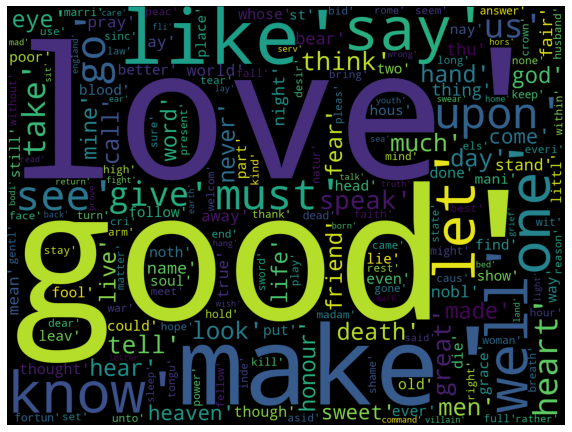

In [ ]:
#Words From Entire Corpus
qs_text = " ".join(acts_df.Proc_Document.astype(str))
cloud = WordCloud(width=1440, height=1080).generate(qs_text)
plt.figure(figsize=(10, 8))
plt.imshow(cloud);
plt.axis('off');

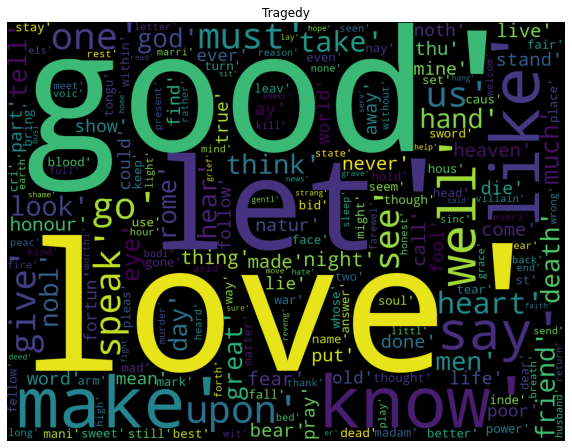

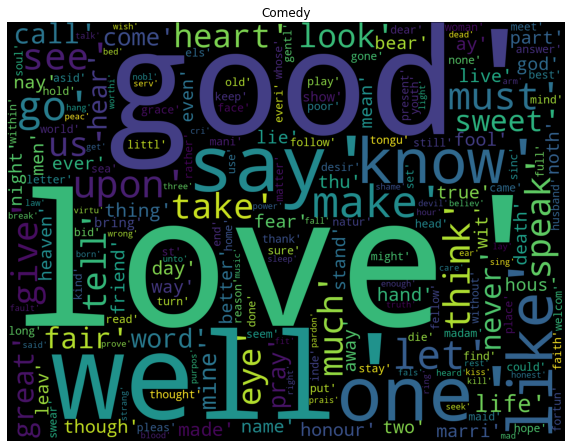

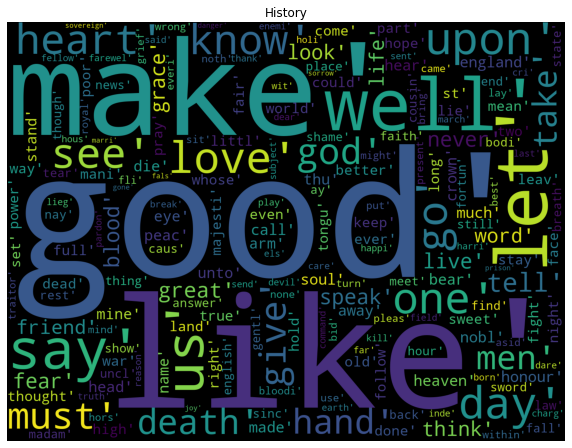

In [ ]:
for genres in set(acts_df.Genre):
  qs_text = " ".join(acts_df[acts_df.Genre== genres].Proc_Document.astype(str))
  cloud = WordCloud(width=1440, height=1080).generate(qs_text)
  plt.figure(figsize=(10, 8))
  plt.imshow(cloud);
  plt.title(genres)
  plt.axis('off');

#Feature  Extraction

We extracted additional features including sentiment analysis, number of words in document, number of unique words, number of named characters, number of stop words, average word lentgh, number of nounse, and sentence length.

In [ ]:
def feature_extraction(df, features = True, sentiment = True, num_words = True, \
                       unique_words = True, charachters = True, stop_words = True, \
                       punctuation = True, upper_words= True, lower_words = True, \
                       word_length= True, num_nouns = True, sentence_length = True, \
                       TFIDF = True, topic_model = True ,standard_scale = True):

  df2 = pd.DataFrame()
  if features:
    sentiment_list = []; num_words_list  = []; \
    unique_words_list = []; charachters_list = []; stop_words_list = []; \
    punctuation_list = []; upper_words_list= []; \
    word_length_list = []; num_nouns_list = []; sentence_length_list = []; \
    TFIDF_list = []; topic_model_list = []

    stops = stopwords.words("english")
    stops = stops + ["act", "scene", "enter", "exit", "exeunt", "epilogue", "i", "ii", "iii", "iv", "v"]
    eng_stopwords = stops + ['art', 'cannot', "come",'doth', 'dost', 'ere', 'ere', 'hast', 'hath', 'hence', 'hither','may', 'nigh', 'oft','shall', 'shouldst', 'thither', 'thee','therefore', 'thou', 'thine', 'thy', 'till', 'tis', 'twas', 'wast', 'whence', 'wherefore', 'whereto','wilt', 'withal', 'wouldst', 'would','ye','yet', 'yon', 'yonder', 'th']
    
    list_of_dfs = pd.read_html('https://www.opensourceshakespeare.org/views/plays/characters/chardisplay.php')
    list(list_of_dfs[1].loc[:,1].values)
    char_names = list(set([word for line in list(list_of_dfs[1].loc[:,1].values) for word in line.lower().split()]))
    table = str.maketrans('', '', string.punctuation)
    char_names = [w.translate(table) for w in char_names]
    charachter_names = list(filter(lambda w: w not in ["slender", "bigot", 'bushy', 'english', 'old', 'grey', 'dull', 'british', 'speak', 'say', 'feeble', 'patience', 'elbow', 'froth', 'saint', 'belch', 'fool' ], char_names))
    
    for docs in df.Full_Document:
      if sentiment:
        #Sentiment Analysis
        sentiment_list.append(TextBlob(docs).sentiment.polarity)

      if num_words:
        ## Number of words in the text ##
        num_words_list.append(len(str(docs).split()))

      if unique_words:
        ## Number of unique words in the text ##
        unique_words_list.append(len(set(str(docs).split())))
            
      if charachters:
        # Number of characters in the text ##
        charachters_list.append(len([w for w in str(docs).lower().split() if w in charachter_names]))

      if stop_words:
        ## Number of stopwords in the text ##
        stop_words_list.append(len([w for w in str(docs).lower().split() if w in eng_stopwords]))

      if punctuation:
        ## Number of punctuations in the text ##
        punctuation_list.append(len([c for c in str(docs) if c in string.punctuation]))

      if upper_words:
        ## Number of upper case words in the text ##
        upper_words_list.append(len([w for w in str(docs).split() if w.isupper()]))

      if word_length:
        ## Average length of the words in the text ##
        word_length_list.append(np.mean([len(w) for w in str(docs).split()]))

      if num_nouns:
        ## Number of noun phrases in text ## 
        num_nouns_list.append(len(TextBlob(docs).noun_phrases))

      if sentence_length:
        ##Average Length of Sentences
        sentence_length_list.append(np.mean([len(str(w).split()) for w in sent_tokenize(docs)]))
    
    df2['polarity']=sentiment_list
    df2["num_words"] = num_words_list
    df2["num_unique_words"] = unique_words_list
    df2["charachters"] = charachters_list
    df2["num_stopwords"] = stop_words_list
    df2["num_punctuations"] = punctuation_list
    df2["num_words_upper"] = upper_words_list
    df2["mean_word_len"] = word_length_list
    df2['num_noun_phrases'] =  num_nouns_list
    df2["sentence_length"] = sentence_length_list

  return df2


In [ ]:
acts_df = pd.concat([acts_df, feature_extraction(acts_df)], axis=1, sort=False)
scenes_df = pd.concat([scenes_df, feature_extraction(scenes_df)], axis=1, sort=False)

In [ ]:
acts_df.describe()

,Comedy,History,Tragedy,polarity,num_words,num_unique_words,charachters,num_stopwords,num_punctuations,num_words_upper,mean_word_len,num_noun_phrases,sentence_length
count,185.000000,185.000000,185.000000,185.000000,185.000000,185.000000,185.000000,185.000000,185.000000,185.000000,185.000000,185.000000,185.000000
mean,0.459459,0.270270,0.270270,0.163285,4747.416216,1798.654054,592.145946,2198.329730,1115.827027,365.816216,4.445342,632.724324,16.130443
std,0.499706,0.445305,0.445305,0.052680,1423.504541,439.596689,200.227222,660.091483,358.197150,136.575345,0.097090,201.579536,2.950156
min,0.000000,0.000000,0.000000,0.030570,1680.000000,746.000000,218.000000,745.000000,433.000000,95.000000,4.198188,186.000000,9.220339
25%,0.000000,0.000000,0.000000,0.130835,3771.000000,1446.000000,441.000000,1779.000000,849.000000,272.000000,4.386792,480.000000,14.084577
50%,0.000000,0.000000,0.000000,0.166013,4706.000000,1782.000000,581.000000,2196.000000,1087.000000,345.000000,4.450271,619.000000,15.704000
75%,1.000000,1.000000,1.000000,0.197900,5547.000000,2073.000000,698.000000,2580.000000,1345.000000,443.000000,4.509345,754.000000,17.848101
max,1.000000,1.000000,1.000000,0.327560,9020.000000,3130.000000,1296.000000,4409.000000,2305.000000,892.000000,4.705698,1270.000000,31.765766


In [ ]:
scenes_df.describe()

,Comedy,History,Tragedy,1,2,3,4,5,polarity,num_words,num_unique_words,charachters,num_stopwords,num_punctuations,num_words_upper,mean_word_len,num_noun_phrases,sentence_length
count,746.000000,746.000000,746.000000,746.000000,746.00000,746.000000,746.000000,746.000000,746.000000,746.000000,746.000000,746.000000,746.000000,746.000000,746.000000,746.000000,746.000000,746.000000
mean,0.398123,0.289544,0.312332,0.179625,0.19437,0.205094,0.234584,0.186327,0.161257,1170.878016,571.839142,146.049598,541.565684,275.660858,89.371314,4.463566,156.774799,15.808845
std,0.489840,0.453855,0.463756,0.384132,0.39598,0.404041,0.424023,0.389632,0.103124,967.643248,375.699070,121.852640,452.400291,231.313545,81.303377,0.158790,129.956318,4.277335
min,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,-0.214286,45.000000,38.000000,8.000000,14.000000,8.000000,2.000000,4.043532,4.000000,6.125000
25%,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.106249,454.750000,288.000000,56.000000,205.250000,104.000000,32.000000,4.363137,64.000000,12.848030
50%,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.160003,920.000000,503.000000,116.500000,414.000000,214.500000,67.000000,4.455786,123.000000,15.288906
75%,1.000000,1.000000,1.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.217514,1612.250000,773.750000,201.000000,751.000000,380.000000,121.000000,4.553093,210.750000,17.996324
max,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,7716.000000,2761.000000,1041.000000,3523.000000,1963.000000,721.000000,5.225000,1103.000000,39.000000


#Topic Modeling LDA

Assigned topics to douments. I set the minimum frequency of words to 10 and maximum frequency to .35, so we would pick up words that we were represented but also had high variance. We had descent perplexity scores, and there seemed to be good distribution of words across topics, with some common themes within topics.

In [ ]:
dictionary = corpora.Dictionary(scenes_df.Proc_Document)
dictionary.filter_extremes(no_below=10, no_above=0.35)
dictionary.compactify()
corpus = [dictionary.doc2bow(doc) for doc in scenes_df.Proc_Document]

lda = models.ldamodel.LdaModel(corpus, num_topics=6, id2word = dictionary, passes=20)

In [ ]:
pp = pprint.PrettyPrinter(indent=4)
pp.pprint(lda.print_topics(num_topics=6, num_words=15))

[   (   0,
        '0.014*"marri" + 0.008*"worship" + 0.008*"woman" + 0.006*"honest" + '
        '0.006*"asid" + 0.006*"inde" + 0.005*"knave" + 0.005*"cousin" + '
        '0.005*"hors" + 0.005*"faith" + 0.005*"desir" + 0.005*"said" + '
        '0.005*"fellow" + 0.004*"get" + 0.004*"brook"'),
    (   1,
        '0.005*"dead" + 0.005*"arm" + 0.005*"soul" + 0.005*"crown" + '
        '0.005*"unto" + 0.005*"england" + 0.004*"peac" + 0.004*"high" + '
        '0.004*"majesti" + 0.003*"tear" + 0.003*"sorrow" + 0.003*"right" + '
        '0.003*"grief" + 0.003*"tongu" + 0.003*"land"'),
    (   2,
        '0.011*"rome" + 0.007*"war" + 0.005*"sword" + 0.004*"power" + '
        '0.004*"peac" + 0.004*"senat" + 0.004*"fight" + 0.004*"cri" + '
        '0.004*"arm" + 0.004*"drum" + 0.004*"trumpet" + 0.003*"citi" + '
        '0.003*"home" + 0.003*"answer" + 0.003*"sound"'),
    (   3,
        '0.019*"fool" + 0.009*"villain" + 0.006*"wit" + 0.005*"mad" + '
        '0.004*"fellow" + 0.004*"dog" + 0.004*"k

In [ ]:
# perplexity
print('Perplexity: ', lda.log_perplexity(corpus))

# coherence score
coherence_model = CoherenceModel(model=lda, texts=scenes_df.Proc_Document, dictionary=dictionary, coherence='c_v')
coherence = coherence_model.get_coherence()
print('Coherence Score: ', coherence)

Perplexity:  -7.674402384760617
Coherence Score:  0.3411690208135946


In [ ]:
lda.get_document_topics(corpus[0], minimum_probability=0.0)

[(0, 0.009718992),
 (1, 0.12607343),
 (2, 0.0029010412),
 (3, 0.0003599989),
 (4, 0.0003601809),
 (5, 0.86058635)]

In [ ]:
def topic_model(df, topics_num = 6):
  dictionary = corpora.Dictionary(df.Proc_Document)
  dictionary.filter_extremes(no_below=10, no_above=0.35)
  dictionary.compactify()
  corpus = [dictionary.doc2bow(doc) for doc in df.Proc_Document]
  lda = models.ldamodel.LdaModel(corpus, num_topics=topics_num, id2word = dictionary, passes=20)

  pp = pprint.PrettyPrinter(indent=4)
  pp.pprint(lda.print_topics(num_topics=topics_num, num_words=15))

  # perplexity
  print('Perplexity: ', lda.log_perplexity(corpus))

  # coherence score
  coherence_model = CoherenceModel(model=lda, texts=scenes_df.Proc_Document, dictionary=dictionary, coherence='c_v')
  coherence = coherence_model.get_coherence()
  print('Coherence Score: ', coherence)

  df3 = pd.DataFrame(columns=[("topic_"+ str(w)) for w in range(topics_num)])
  for index, doc in enumerate(corpus):
    topics_list = []
    for counter, topics in enumerate(lda.get_document_topics(doc, minimum_probability=0.0)):
      topics_list.append(topics[1])
    df3.loc[index] = topics_list
  return df3

In [ ]:
scenes_df = pd.concat([scenes_df, topic_model(scenes_df)], axis=1, sort=False)
acts_df = pd.concat([acts_df, topic_model(acts_df)], axis=1, sort=False)

[   (   0,
        '0.005*"dead" + 0.004*"soul" + 0.004*"tear" + 0.003*"madam" + '
        '0.003*"kill" + 0.003*"tongu" + 0.003*"earth" + 0.003*"unto" + '
        '0.003*"sorrow" + 0.003*"gentl" + 0.003*"grief" + 0.003*"dear" + '
        '0.003*"high" + 0.003*"peac" + 0.003*"rest"'),
    (   1,
        '0.005*"marri" + 0.005*"husband" + 0.005*"ring" + 0.004*"signior" + '
        '0.004*"faith" + 0.004*"best" + 0.004*"woman" + 0.004*"swear" + '
        '0.003*"matter" + 0.003*"tongu" + 0.003*"inde" + 0.003*"welcom" + '
        '0.003*"fellow" + 0.003*"honest" + 0.003*"kiss"'),
    (   2,
        '0.006*"high" + 0.005*"power" + 0.004*"answer" + 0.004*"busi" + '
        '0.004*"em" + 0.004*"state" + 0.004*"caus" + 0.004*"england" + '
        '0.003*"deserv" + 0.003*"appear" + 0.003*"majesti" + 0.003*"wish" + '
        '0.003*"law" + 0.003*"dare" + 0.003*"peac"'),
    (   3,
        '0.006*"rome" + 0.005*"natur" + 0.004*"sea" + 0.004*"home" + '
        '0.004*"power" + 0.004*"strang" + 0.

In [ ]:
acts_df.head()

,Full_Document,Author,Genre,Title,ACT,Proc_Document,key_words,Year,Comedy,History,Tragedy,polarity,num_words,num_unique_words,charachters,num_stopwords,num_punctuations,num_words_upper,mean_word_len,num_noun_phrases,sentence_length,topic_0,topic_1,topic_2,topic_3,topic_4,topic_5
0,I\nSCENE I. Rousillon. The COUNT's palace.\n\...,Shakespeare,Comedy,All's Well That Ends Well,1,"[rousillon, palac, rousillon, black, deliv, bu...",rousillon palac rousillon black deliv buri hus...,1602,1,0,0,0.192312,4614,1804,472,2232,1038,273,4.445600,532,18.604839,0.025449,0.438948,0.516825,0.000340,0.018098,0.000340
1,II\nSCENE I. Paris. The KING's palace.\n\nFlo...,Shakespeare,Comedy,All's Well That Ends Well,2,"[palac, flourish, cornet, attend, diver, take,...",palac flourish cornet attend diver take leav f...,1602,1,0,0,0.231503,6131,2165,668,2925,1446,491,4.357527,776,15.760925,0.071029,0.579736,0.126875,0.000274,0.191229,0.030857
2,III\nSCENE I. Florence. The DUKE's palace.\n\...,Shakespeare,Comedy,All's Well That Ends Well,3,"[palac, flourish, attend, two, frenchmen, troo...",palac flourish attend two frenchmen troop poin...,1602,1,0,0,0.179491,4130,1549,523,2053,850,258,4.335109,463,16.388889,0.000412,0.147032,0.000412,0.000412,0.583288,0.268445
3,IV\nSCENE I. Without the Florentine camp.\n\n...,Shakespeare,Comedy,All's Well That Ends Well,4,"[without, florentin, camp, five, six, ambush, ...",without florentin camp five six ambush way hed...,1602,1,0,0,0.177343,5556,1901,793,2711,1192,292,4.350432,555,16.887538,0.000285,0.000285,0.000285,0.000285,0.872350,0.126510
4,V\nSCENE I. Marseilles. A street.\n\nEnter HE...,Shakespeare,Comedy,All's Well That Ends Well,5,"[marseil, street, two, exceed, post, day, nigh...",marseil street two exceed post day night must ...,1602,1,0,0,0.212355,3799,1446,382,1813,869,293,4.256910,469,16.662281,0.000469,0.799672,0.000469,0.000469,0.198453,0.000469


#TF-IDF

We used TFIDF to measure the distribution of words within the document. I chose a maximum of 500 words in order to reduce dimensionality and have words that were well represented with high variance.

In [ ]:
def TF_IDF(df,max_featu=500):
  vectorizer = TfidfVectorizer(norm=None, max_features=max_featu) #Ignoring the norm (ie. no Euclidean norm)
  X = vectorizer.fit_transform(df.key_words)
  vocabulary = vectorizer.get_feature_names()
  df2 = pd.DataFrame(X.todense(),columns=vocabulary)
  print("TFIDF Shape:",df2.shape)

  return df2

In [ ]:
acts_df2= pd.concat([acts_df, TF_IDF(acts_df)], axis=1, sort=False)
scenes_df2= pd.concat([scenes_df, TF_IDF(scenes_df)], axis=1, sort=False)
scenes_df2.head()

TFIDF Shape: (185, 500)
TFIDF Shape: (746, 500)


,Full_Document,Author,Genre,Title,ACT,SCENE,Proc_Document,key_words,Year,Comedy,History,Tragedy,1,2,3,4,5,polarity,num_words,num_unique_words,charachters,num_stopwords,num_punctuations,num_words_upper,mean_word_len,num_noun_phrases,sentence_length,topic_0,topic_1,topic_2,topic_3,topic_4,topic_5,action,affect,age,ah,air,ala,almost,...,virtu,voic,vow,walk,wall,want,war,warrant,water,way,wear,weep,welcom,well,white,whose,wind,wise,wish,wit,within,without,woe,woman,women,wonder,word,work,world,wors,worth,worthi,wound,write,wrong,ye,yea,year,yield,youth
0,I. Rousillon. The COUNT's palace.\n\nEnter BE...,Shakespeare,Comedy,All's Well That Ends Well,1,1,"[rousillon, palac, rousillon, black, deliv, bu...",rousillon palac rousillon black deliv buri hus...,1602,1,0,0,1,0,0,0,0,0.172124,1850,879,195,869,412,108,4.552973,211,16.818182,0.406006,0.000360,0.019738,0.000360,0.573176,0.000360,0.0,5.559567,0.000000,0.0,0.0,0.0,2.681591,...,12.928136,0.0,0.000000,0.0,0.0,5.306441,2.226993,0.000000,0.000000,1.772521,7.440800,2.566209,0.000000,5.195602,0.0,7.757246,2.486166,0.0,11.489726,0.00000,2.021354,0.000000,0.0,0.000000,0.0,0.000000,0.000000,2.540891,1.829168,2.779783,2.696084,2.625633,0.000000,0.000000,2.327798,0.000000,0.0,2.528469,0.0,0.000000
1,II. Paris. The KING's palace.\n\nFlourish of ...,Shakespeare,Comedy,All's Well That Ends Well,1,2,"[palac, flourish, cornet, letter, diver, flore...",palac flourish cornet letter diver florentin s...,1602,1,0,0,1,0,0,0,0,0.196751,648,406,73,307,143,32,4.538580,95,18.000000,0.001033,0.001034,0.710289,0.001034,0.285578,0.001033,0.0,0.000000,2.674423,0.0,0.0,0.0,0.000000,...,0.000000,0.0,0.000000,0.0,0.0,0.000000,2.226993,0.000000,0.000000,0.000000,0.000000,0.000000,4.846217,5.195602,0.0,5.817934,0.000000,0.0,4.595890,2.18672,0.000000,0.000000,0.0,0.000000,0.0,0.000000,1.644803,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,4.960533
2,III. Rousillon. The COUNT's palace.\n\nEnter ...,Shakespeare,Comedy,All's Well That Ends Well,1,3,"[rousillon, palac, hear, say, madam, care, eve...",rousillon palac hear say madam care even conte...,1602,1,0,0,1,0,0,0,0,0.209720,2112,951,204,1052,483,129,4.323864,228,20.307692,0.117633,0.171697,0.149441,0.000357,0.560515,0.000356,0.0,2.779783,2.674423,0.0,0.0,0.0,0.000000,...,0.000000,0.0,2.897566,0.0,0.0,0.000000,0.000000,0.000000,2.756253,1.772521,2.480267,0.000000,0.000000,6.494502,0.0,5.817934,0.000000,0.0,6.893836,0.00000,0.000000,4.213354,0.0,11.416732,0.0,0.000000,1.644803,2.540891,7.316671,0.000000,0.000000,0.000000,5.421581,0.000000,0.000000,2.592185,0.0,2.528469,0.0,7.440800
3,I. Paris. The KING's palace.\n\nFlourish of c...,Shakespeare,Comedy,All's Well That Ends Well,2,1,"[palac, flourish, cornet, attend, diver, take,...",palac flourish cornet attend diver take leav f...,1602,1,0,0,0,1,0,0,0,0.288618,1791,904,181,822,389,116,4.412619,237,19.681319,0.278504,0.124201,0.392620,0.186264,0.018051,0.000359,0.0,0.000000,0.000000,0.0,0.0,0.0,0.000000,...,0.000000,0.0,0.000000,0.0,0.0,0.000000,8.907974,0.000000,0.000000,5.317562,2.480267,0.000000,2.423108,7.793403,0.0,1.939311,0.000000,0.0,2.297945,0.00000,6.064061,0.000000,0.0,0.000000,0.0,5.320476,3.289607,2.540891,0.000000,5.559567,2.696084,5.251265,0.000000,2.915585,0.000000,2.592185,0.0,5.056938,0.0,2.480267
4,II. Rousillon. The COUNT's palace.\n\nEnter C...,Shakespeare,Comedy,All's Well That Ends Well,2,2,"[rousillon, palac, put, height, breed, show, h...",rousillon palac put height breed show highli f...,1602,1,0,0,0,1,0,0,0,0.119848,576,298,73,276,154,41,4.229167,67,12.000000,0.001334,0.001335,0.001338,0.001335,0.993323,0.001335,0.0,0.000000,0.000000,0.0,0.0,0.0,0.000000,...,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,2.681591,0.000000,0.000000,0.000000,0.000000,0.000000,2.597801,0.0,0.000000,0.000000,0.0,0.000000,0.00000,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,2.779783,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,

##TSNE ACTS Features TFIDF Scaled

Here we'll simply jsut start by visualizing our TFIDF Scaled data for all features. 

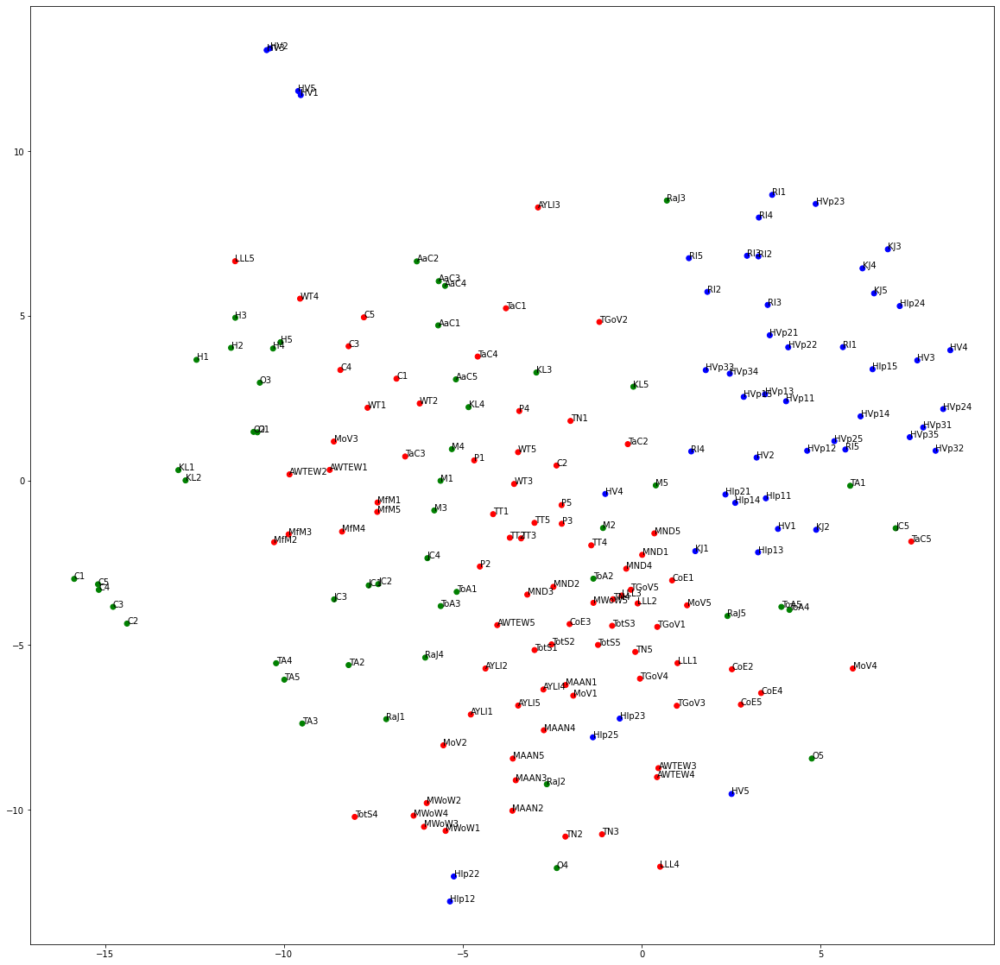

In [ ]:
scaler = StandardScaler()
scaler.fit(acts_df2.iloc[:,7:])
tsne_model = manifold.TSNE(perplexity=20, n_components=2, init='pca', method='exact', n_iter=2500, random_state=23) 
act_new_values = tsne_model.fit_transform(scaler.transform(acts_df2.iloc[:,7:]))

x = []
y = []
for value in act_new_values:
    x.append(value[0])
    y.append(value[1])
colors = {'Comedy':'red', 'History':'blue', 'Tragedy':'green'}
fig, ax = plt.subplots(figsize=(20,20))         
ax.scatter(x,y, c=acts_df.Genre.apply(lambda x: colors[x]))
for i, names in enumerate([acts_df2.Title.apply(lambda x: ''.join(i[0] for i in x.split())) + acts_df2.ACT.astype(str)][0]):
    ax.annotate(names, (x[i], y[i]))
plt.show()

In [400]:
acts_df2.iloc[:,7:].head()

,Year,Comedy,History,Tragedy,polarity,num_words,num_unique_words,charachters,num_stopwords,num_punctuations,num_words_upper,mean_word_len,num_noun_phrases,sentence_length,topic_0,topic_1,topic_2,topic_3,topic_4,topic_5,action,affect,age,ah,air,ala,almost,alon,alreadi,answer,appear,arm,asid,ask,attend,away,ay,back,banish,base,...,virtu,voic,vow,walk,wall,want,war,warrant,water,way,wear,weep,welcom,well,white,whose,wind,wise,wish,wit,within,without,woe,woman,women,wonder,word,work,world,wors,worth,worthi,wound,write,wrong,ye,yea,year,yield,youth
0,1602,1,0,0,0.192312,4614,1804,472,2232,1038,273,4.445600,532,18.604839,0.025449,0.438948,0.516825,0.000340,0.018098,0.000340,0.00000,5.144662,2.979096,0.000000,0.000000,0.000000,1.620576,3.068798,0.00000,3.645334,0.000000,2.582545,1.397433,1.463573,2.876510,5.304803,2.263993,0.000000,0.000000,0.000000,...,7.491794,0.000000,1.748410,0.0,0.000000,3.143573,3.014496,0.000000,1.610626,2.110525,5.654249,1.498359,2.763119,13.070081,0.000000,11.137589,1.463573,0.000000,12.912727,1.26992,1.163152,2.430223,0.0,6.639534,0.000000,0.000000,2.087926,2.859912,5.508913,1.693147,1.651036,1.581356,3.407916,0.000000,1.327907,1.591018,0.000000,2.961629,0.000000,7.317864
1,1602,1,0,0,0.231503,6131,2165,668,2925,1446,491,4.357527,776,15.760925,0.071029,0.579736,0.126875,0.000274,0.191229,0.030857,0.00000,0.000000,4.468645,0.000000,0.000000,0.000000,0.000000,3.068798,3.34374,12.151114,0.000000,2.582545,1.397433,7.317864,7.191275,8.487686,7.923975,2.525804,2.200395,1.703958,...,5.993435,1.640779,1.748410,0.0,0.000000,3.143573,16.579726,3.302071,0.000000,5.276313,2.827125,0.000000,1.381560,32.172507,1.881941,5.568794,0.000000,3.143573,3.873818,0.00000,4.652607,3.645334,0.0,0.000000,0.000000,4.548649,5.219816,1.429956,3.305348,5.079442,4.953107,7.906779,0.000000,5.279516,5.311627,9.546106,0.000000,2.961629,0.000000,5.854291
2,1602,1,0,0,0.179491,4130,1549,523,2053,850,258,4.335109,463,16.388889,0.000412,0.147032,0.000412,0.000412,0.583288,0.268445,1.84372,0.000000,1.489548,1.963067,3.182035,3.143573,1.620576,0.000000,3.34374,0.000000,0.000000,1.291273,1.397433,1.463573,1.438255,4.243843,7.923975,0.000000,0.000000,1.703958,...,1.498359,0.000000,3.496820,0.0,2.114873,0.000000,6.028991,1.651036,1.610626,4.221051,1.413562,0.000000,2.763119,11.059299,0.000000,1.113759,1.463573,0.000000,1.291273,0.00000,1.163152,2.430223,0.0,1.327907,0.000000,0.000000,5.219816,1.429956,2.203565,0.000000,4.953107,9.488135,0.000000,12.318870,0.000000,0.000000,0.000000,0.000000,3.221252,0.000000
3,1602,1,0,0,0.177343,5556,1901,793,2711,1192,292,4.350432,555,16.887538,0.000285,0.000285,0.000285,0.000285,0.872350,0.126510,1.84372,0.000000,0.000000,0.000000,0.000000,0.000000,3.241153,0.000000,1.67187,7.290668,0.000000,1.291273,1.397433,4.390718,0.000000,2.121921,3.395989,1.262902,0.000000,0.000000,...,4.495077,1.640779,6.993639,0.0,0.000000,1.571786,6.028991,1.651036,0.000000,5.276313,1.413562,1.498359,2.763119,17.091644,0.000000,4.455036,0.000000,0.000000,1.291273,1.26992,3.489455,4.860446,0.0,2.655814,1.703958,1.516216,2.087926,1.429956,5.508913,0.000000,1.651036,1.581356,0.000000,0.000000,1.327907,0.000000,1.714887,0.000000,0.000000,2.927145
4,1602,1,0,0,0.212355,3799,1446,382,1813,869,293,4.256910,469,16.662281,0.000469,0.799672,0.000469,0.000469,0.198453,0.000469,0.00000,0.000000,1.489548,0.000000,0.000000,0.000000,0.000000,1.534399,1.67187,1.215111,1.552918,0.000000,1.397433,2.927145,1.438255,10.609607,2.263993,0.000000,0.000000,0.000000,...,2.996718,0.000000,5.245230,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,3.165788,5.654249,2.996718,1.381560,8.043127,0.000000,6.682553,1.463573,0.000000,0.000000,1.26992,1.163152,1.215111,0.0,6.639534,1.703958,1.516216,5.219816,0.000000,1.101783,0.000000,0.000000,0.000000,0.000000,0.000000,2.655814,1.591018,0.000000,0.000000,0.000000,2.927145


SCENES Features TFIDF Scaled

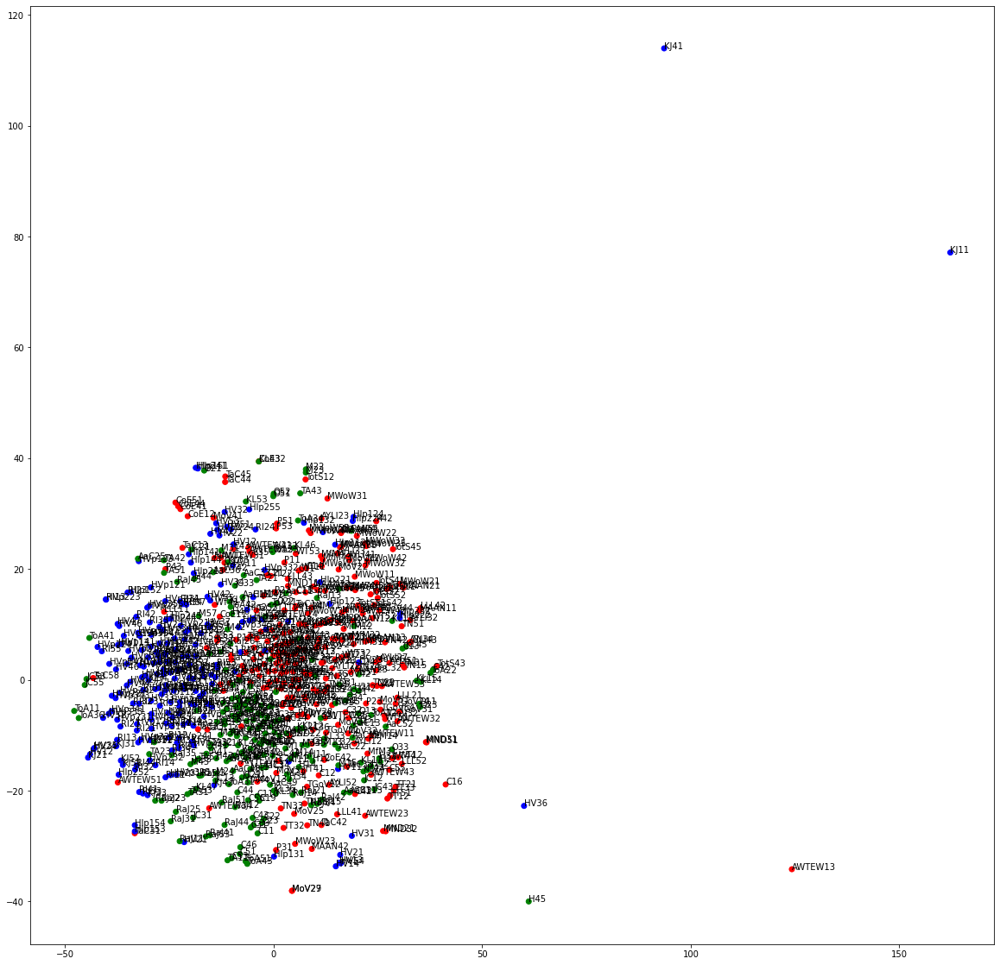

In [ ]:
scaler = StandardScaler()
scaler.fit(scenes_df2.iloc[:,8:])
tsne_model = manifold.TSNE(perplexity=20, n_components=2, init='pca', method='exact', n_iter=2500, random_state=23)
scenes_new_values = tsne_model.fit_transform(scaler.transform(scenes_df2.iloc[:,8:]))

x = []
y = []
for value in scenes_new_values:
    x.append(value[0])
    y.append(value[1])
colors = {'Comedy':'red', 'History':'blue', 'Tragedy':'green'}
#colors = {1:'red', 2:'blue', 3:'green', 4:'black', 5:"yellow",  6:"orange",  7:"purple"}
fig, ax = plt.subplots(figsize=(20,20))         
ax.scatter(x,y, c=scenes_df.Genre.apply(lambda x: colors[x]))
for i, names in enumerate([scenes_df2.Title.apply(lambda x: ''.join(i[0] for i in x.split())) + scenes_df2.ACT.astype(str) + scenes_df2.SCENE.astype(str)][0]):
    ax.annotate(names, (x[i], y[i]))
plt.show()

ACTS Topics

In [ ]:
scaler = StandardScaler()
scaler.fit(acts_df2.iloc[:,21:27])
tsne_model = manifold.TSNE(perplexity=40, n_components=2, init='pca', method='exact', n_iter=2500, random_state=23) 
new_values = tsne_model.fit_transform(scaler.transform(acts_df2.iloc[:,21:27]))

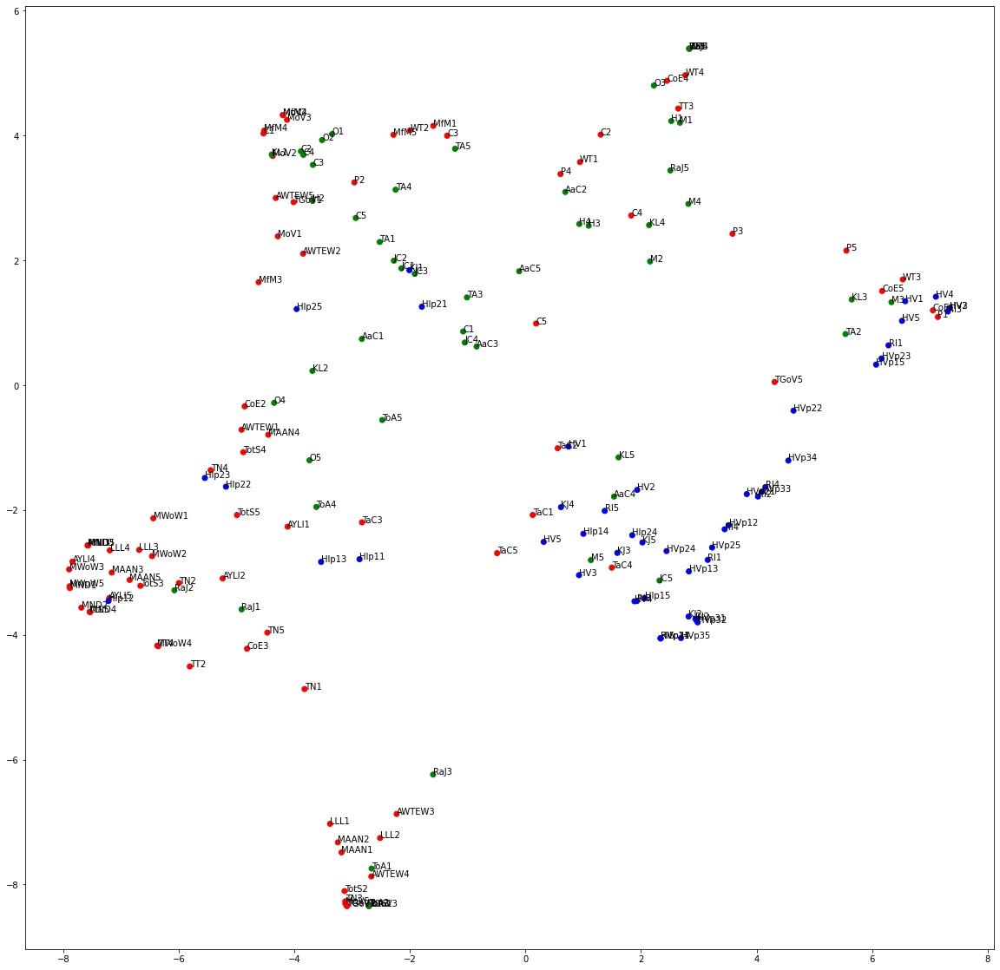

In [ ]:
x = []
y = []
for value in new_values:
    x.append(value[0])
    y.append(value[1])
colors = {'Comedy':'red', 'History':'blue', 'Tragedy':'green'}
#colors = {1:'red', 2:'blue', 3:'green', 4:'black', 5:"yellow"}
fig, ax = plt.subplots(figsize=(20,20))         
ax.scatter(x,y, c=acts_df.Genre.apply(lambda x: colors[x]))
for i, names in enumerate([acts_df2.Title.apply(lambda x: ''.join(i[0] for i in x.split())) + acts_df2.ACT.astype(str)][0]):
    ax.annotate(names, (x[i], y[i]))
plt.show()

SCENES Tops

In [ ]:
scaler = StandardScaler()
scaler.fit(scenes_df2.iloc[:,22:28])
tsne_model = manifold.TSNE(perplexity=40, n_components=2, init='pca', method='exact', n_iter=2500, random_state=23) 
new_values = tsne_model.fit_transform(scaler.transform(scenes_df2.iloc[:,22:28]))



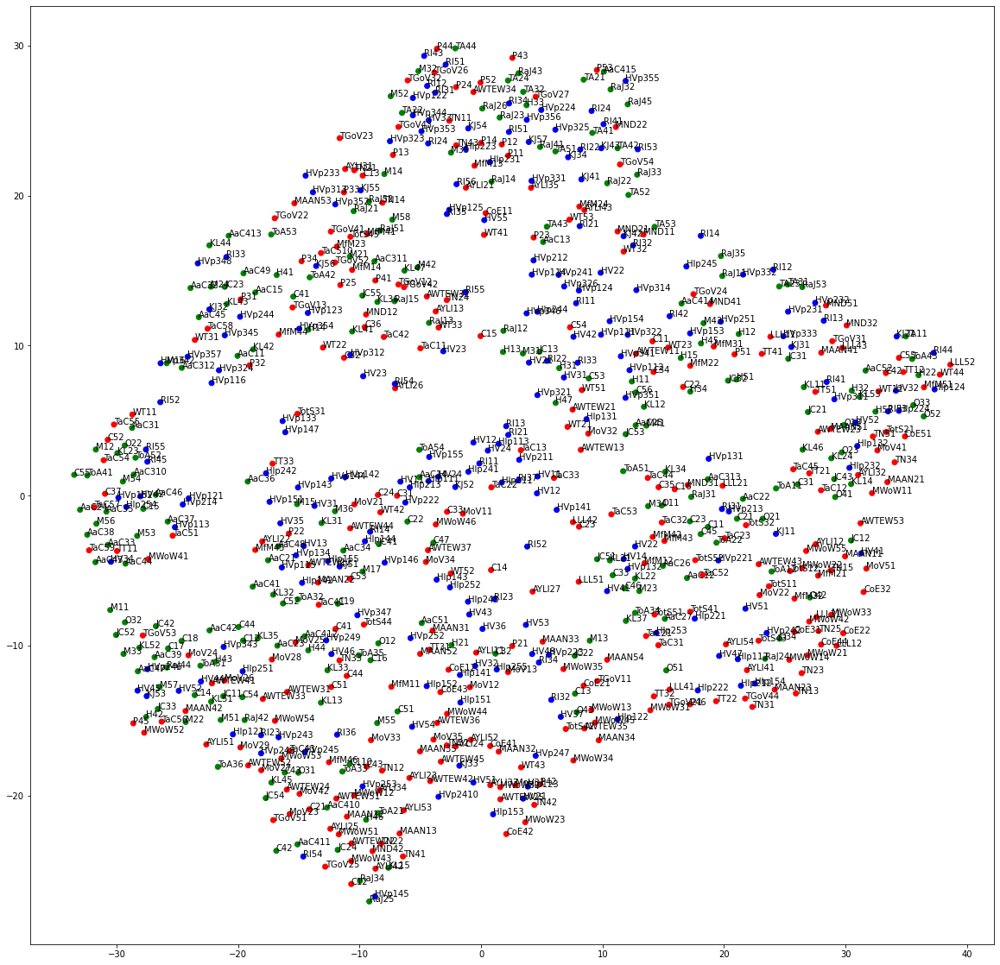

In [ ]:
x = []
y = []
for value in new_values:
    x.append(value[0])
    y.append(value[1])
colors = {'Comedy':'red', 'History':'blue', 'Tragedy':'green'}
#colors = {1:'red', 2:'blue', 3:'green', 4:'black', 5:"yellow"}
fig, ax = plt.subplots(figsize=(20,20))         
ax.scatter(x,y, c=scenes_df.Genre.apply(lambda x: colors[x]))
for i, names in enumerate([scenes_df2.Title.apply(lambda x: ''.join(i[0] for i in x.split())) + scenes_df2.ACT.astype(str) + scenes_df2.SCENE.astype(str)][0]):
    ax.annotate(names, (x[i], y[i]))
plt.show()

Plot ACTS By Title Using All Features

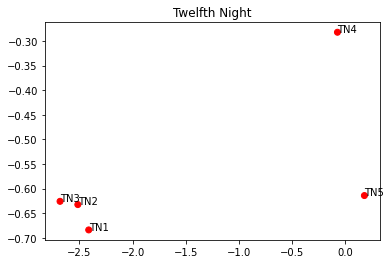

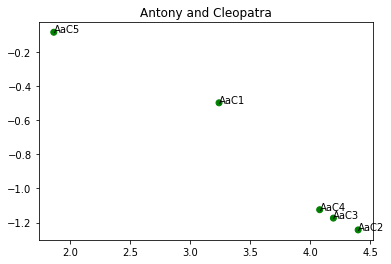

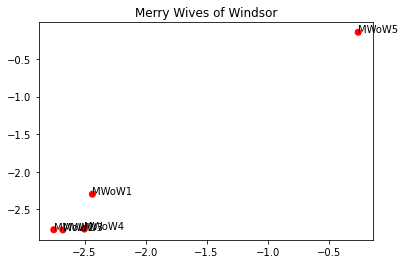

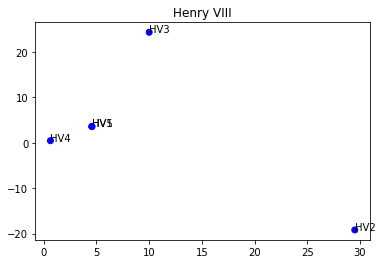

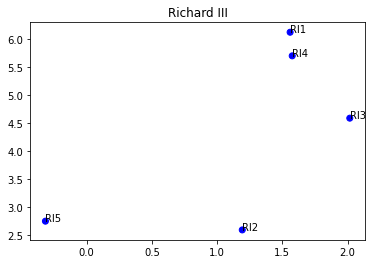

...

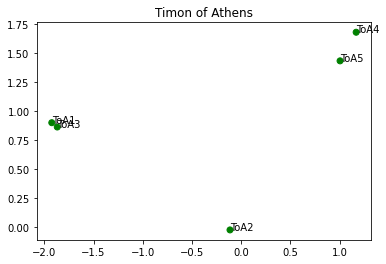

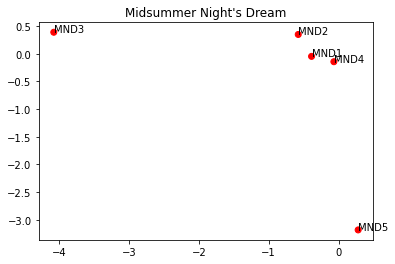

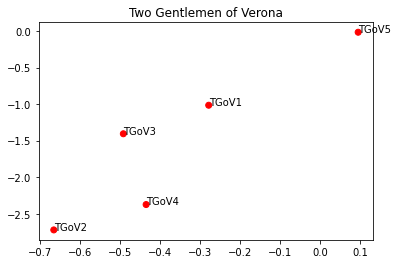

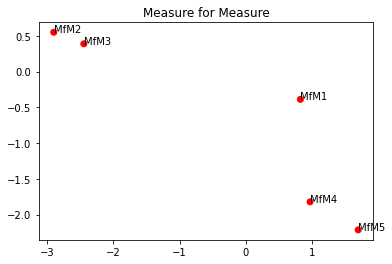

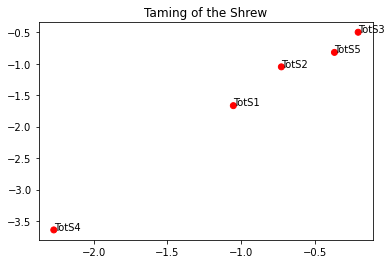

In [ ]:
scaler = StandardScaler()
scaler.fit(acts_df2.iloc[:,7:])
tsne_model = manifold.TSNE(perplexity=40, n_components=2, init='pca', method='exact', n_iter=2500, random_state=23) 
new_values = tsne_model.fit_transform(scaler.transform(acts_df2.iloc[:,7:]))
x = []
y = []
for value in new_values:
    x.append(value[0])
    y.append(value[1])
x = np.array(x)
y = np.array(y)

for title in set(acts_df2.Title):
  colors = {'Comedy':'red', 'History':'blue', 'Tragedy':'green'}
  #colors = {1:'red', 2:'blue', 3:'green', 4:'black', 5:"yellow"}
  fig, ax = plt.subplots(figsize=(6,4))         
  ax.scatter(x[acts_df2.Title == title], y[acts_df2.Title== title], c=acts_df[acts_df2.Title== title].Genre.apply(lambda x: colors[x]))
  for i, names in enumerate([acts_df2[acts_df2.Title== title].Title.apply(lambda x: ''.join(i[0] for i in x.split())) + acts_df2[acts_df2.Title== title].ACT.astype(str)][0]):
      ax.annotate(names, (x[acts_df2.Title== title][i], y[acts_df2.Title== title][i]))
      #ax.set_xlim([-6, 5])
      #ax.set_ylim([-9, 10])
  plt.title(title)
  plt.show()

Plot Scenes By Title Using All Features

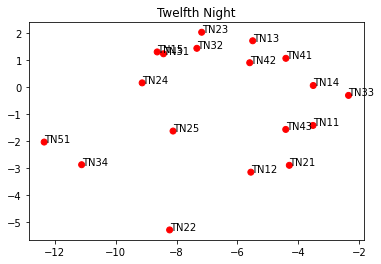

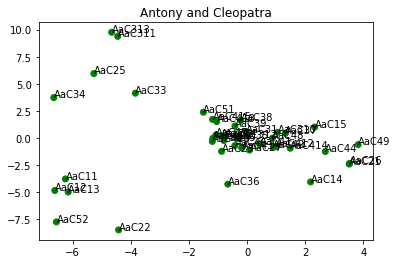

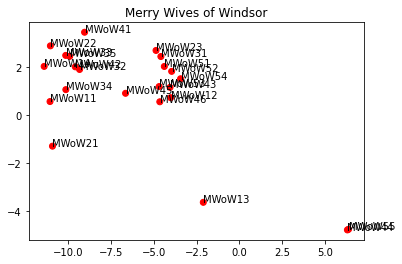

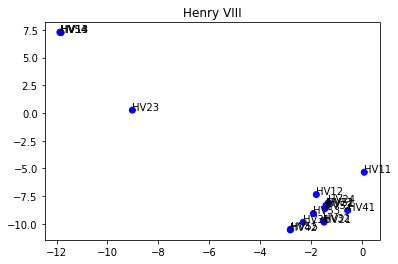

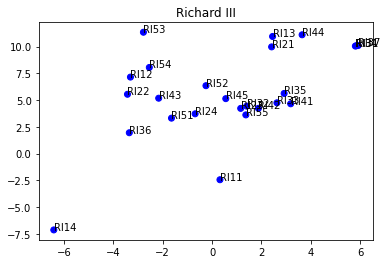

...

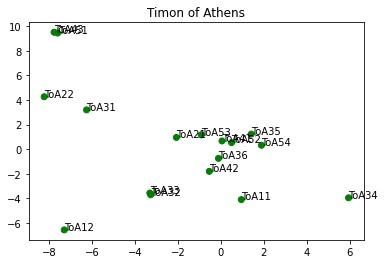

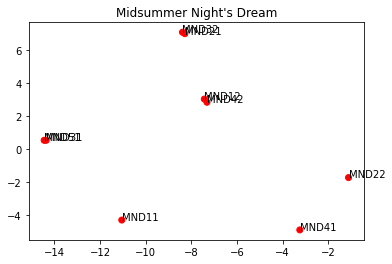

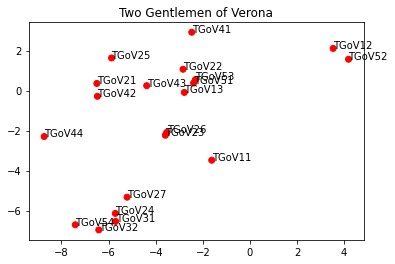

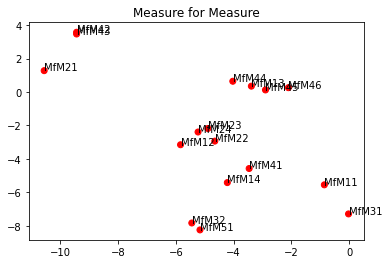

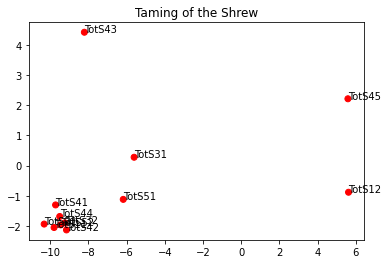

In [ ]:
scaler = StandardScaler()
scaler.fit(scenes_df2.iloc[:,8:])
tsne_model = manifold.TSNE(perplexity=40, n_components=2, init='pca', method='exact', n_iter=2500, random_state=23) 
new_values = tsne_model.fit_transform(scaler.transform(scenes_df2.iloc[:,8:]))
x = []
y = []
for value in new_values:
    x.append(value[0])
    y.append(value[1])
x = np.array(x)
y = np.array(y)

for title in set(scenes_df2.Title):
  colors = {'Comedy':'red', 'History':'blue', 'Tragedy':'green'}
  #colors = {1:'red', 2:'blue', 3:'green', 4:'black', 5:"yellow"}
  fig, ax = plt.subplots(figsize=(6,4))         
  ax.scatter(x[scenes_df2.Title == title], y[scenes_df2.Title== title], c=scenes_df[scenes_df2.Title== title].Genre.apply(lambda x: colors[x]))
  for i, names in enumerate([scenes_df2[scenes_df2.Title== title].Title.apply(lambda x: ''.join(i[0] for i in x.split())) + scenes_df2[scenes_df2.Title== title].ACT.astype(str) + scenes_df2[scenes_df2.Title== title].SCENE.astype(str)][0]):
      ax.annotate(names, (x[scenes_df2.Title== title][i], y[scenes_df2.Title== title][i]))
      #ax.set_xlim([-16, 13])
      #ax.set_ylim([-15, 15])
  plt.title(title)
  plt.show()

### One Hot encode Titles to control for variation between Plays.


For the sake of experimentation we included genre in both our ACT and Scene corpus. We included ACT in our Scene corpus, in order to account for this variation due to genre or act structure. 

This may have led to grouping our fetaures together because of the categorical variables - in other words the grouping of similar plays together may be an artifact of the one hot encoding and not something having to do with similarity (remember we removed character names as stop words above). 

In [ ]:
acts_df6= pd.concat([acts_df2, pd.get_dummies(acts_df['Title'])], axis=1, sort=False)
scenes_df6= pd.concat([scenes_df2, pd.get_dummies(scenes_df['Title'])], axis=1, sort=False)

TSNE ACTS Features TFIDF Scaled

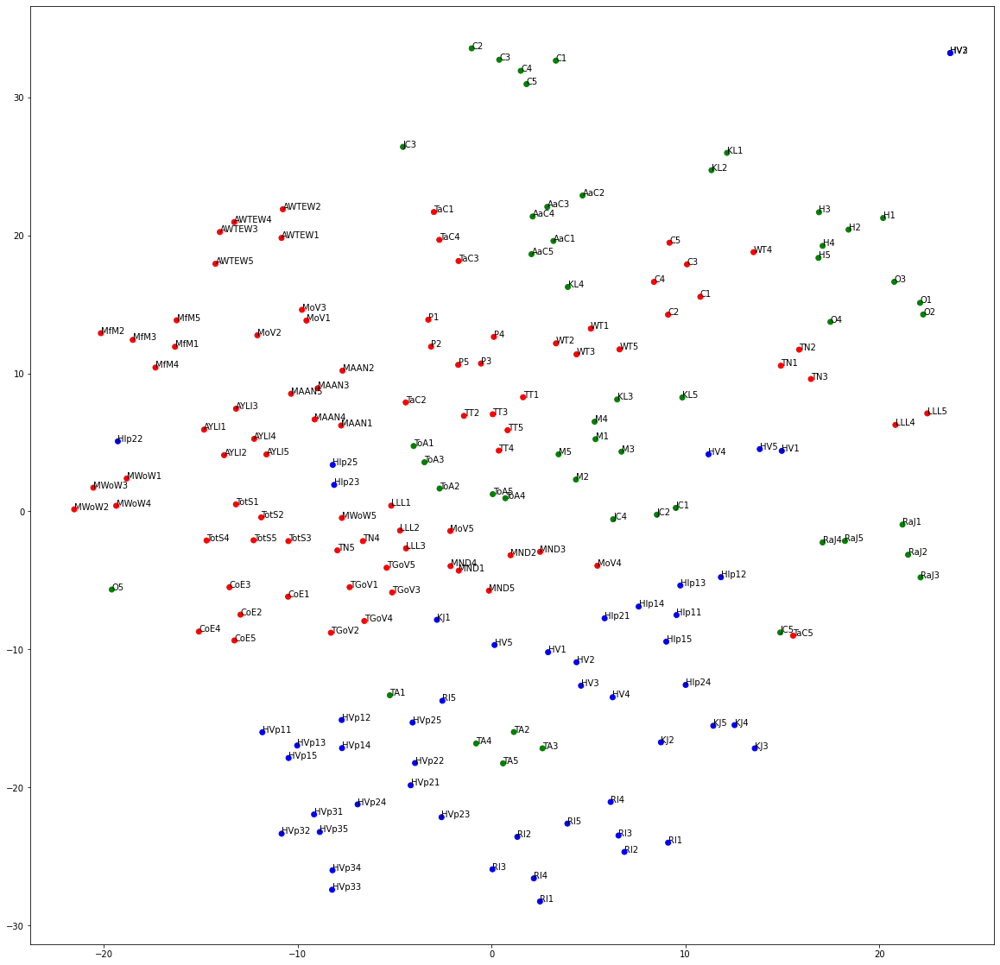

In [ ]:
scaler = StandardScaler()
scaler.fit(acts_df6.iloc[:,7:])
tsne_model = manifold.TSNE(perplexity=20, n_components=2, init='pca', method='exact', n_iter=2500, random_state=23) 
act_new_values = tsne_model.fit_transform(scaler.transform(acts_df6.iloc[:,7:]))

x = []
y = []
for value in act_new_values:
    x.append(value[0])
    y.append(value[1])
#colors = {'Comedy':'red', 'History':'blue', 'Tragedy':'green'}
fig, ax = plt.subplots(figsize=(20,20))         
ax.scatter(x,y, c=acts_df.Genre.apply(lambda x: colors[x]))
for i, names in enumerate([acts_df6.Title.apply(lambda x: ''.join(i[0] for i in x.split())) + acts_df6.ACT.astype(str)][0]):
    ax.annotate(names, (x[i], y[i]))
plt.show()

SCENES Features TFIDF Scaled

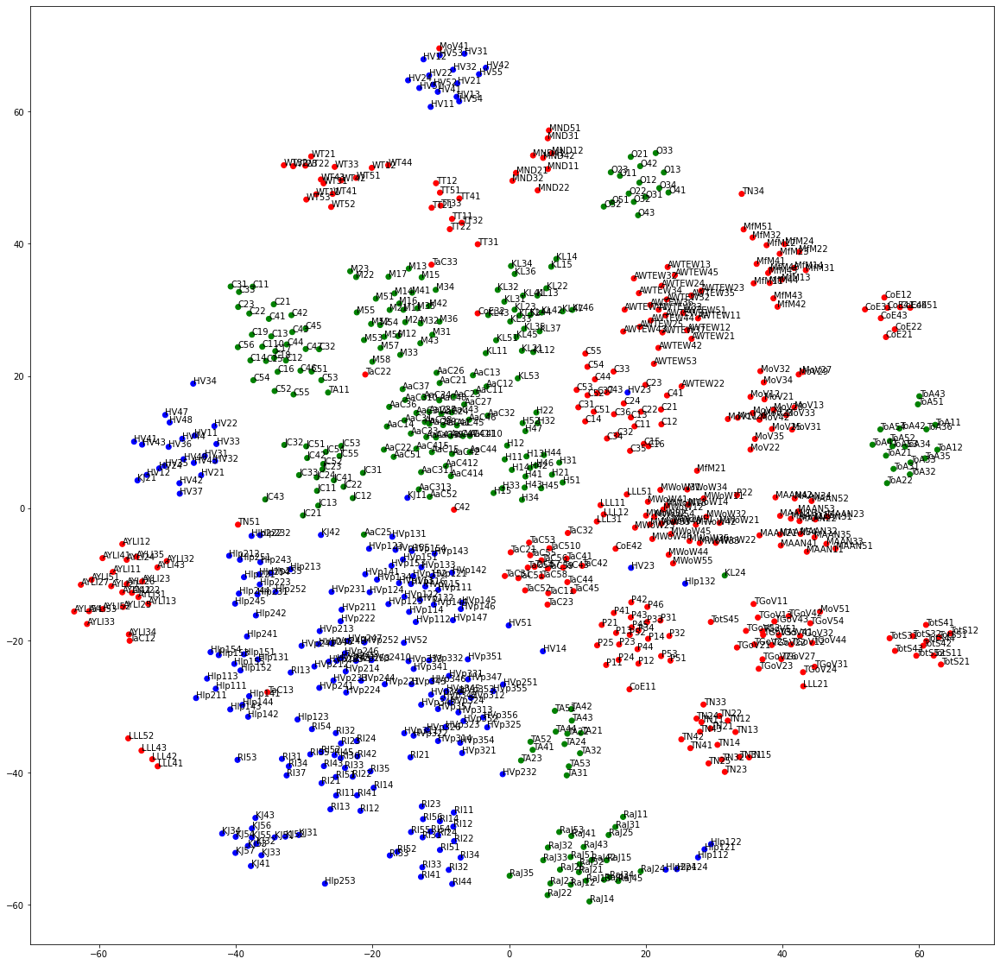

In [ ]:
scaler = StandardScaler()
scaler.fit(scenes_df6.iloc[:,8:])
tsne_model = manifold.TSNE(perplexity=20, n_components=2, init='pca', method='exact', n_iter=2500, random_state=23)
scenes_new_values = tsne_model.fit_transform(scaler.transform(scenes_df6.iloc[:,8:]))

x = []
y = []
for value in scenes_new_values:
    x.append(value[0])
    y.append(value[1])
colors = {'Comedy':'red', 'History':'blue', 'Tragedy':'green'}
#colors = {1:'red', 2:'blue', 3:'green', 4:'black', 5:"yellow",  6:"orange",  7:"purple"}
fig, ax = plt.subplots(figsize=(20,20))         
ax.scatter(x,y, c=scenes_df.Genre.apply(lambda x: colors[x]))
for i, names in enumerate([scenes_df6.Title.apply(lambda x: ''.join(i[0] for i in x.split())) + scenes_df6.ACT.astype(str) + scenes_df6.SCENE.astype(str)][0]):
    ax.annotate(names, (x[i], y[i]))
plt.show()

ACTS Topics

In [ ]:
scaler = StandardScaler()
scaler.fit(acts_df6.iloc[:,21:27])
tsne_model = manifold.TSNE(perplexity=40, n_components=2, init='pca', method='exact', n_iter=2500, random_state=23) 
new_values = tsne_model.fit_transform(scaler.transform(acts_df6.iloc[:,21:27]))

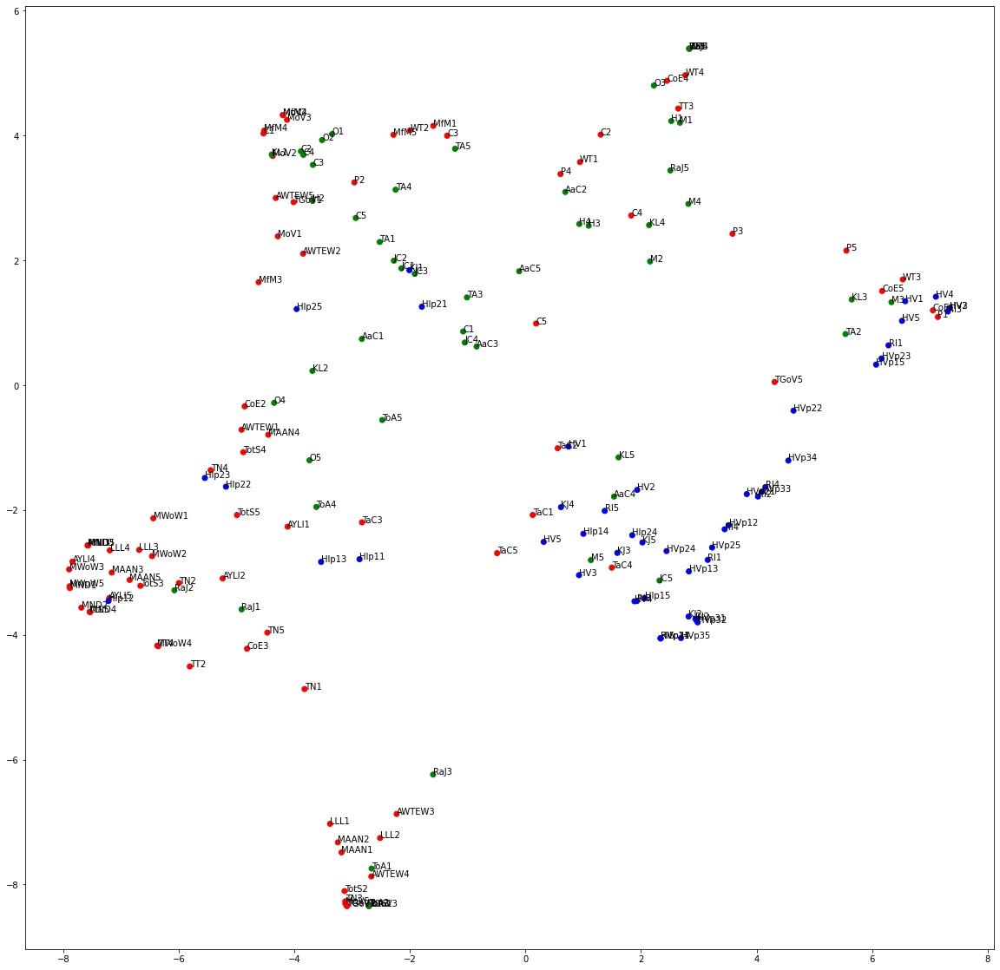

In [ ]:
x = []
y = []
for value in new_values:
    x.append(value[0])
    y.append(value[1])
colors = {'Comedy':'red', 'History':'blue', 'Tragedy':'green'}
#colors = {1:'red', 2:'blue', 3:'green', 4:'black', 5:"yellow"}
fig, ax = plt.subplots(figsize=(20,20))         
ax.scatter(x,y, c=acts_df.Genre.apply(lambda x: colors[x]))
for i, names in enumerate([acts_df6.Title.apply(lambda x: ''.join(i[0] for i in x.split())) + acts_df6.ACT.astype(str)][0]):
    ax.annotate(names, (x[i], y[i]))
plt.show()

SCENES Tops

In [ ]:
scaler = StandardScaler()
scaler.fit(scenes_df6.iloc[:,22:28])
tsne_model = manifold.TSNE(perplexity=40, n_components=2, init='pca', method='exact', n_iter=2500, random_state=23) 
new_values = tsne_model.fit_transform(scaler.transform(scenes_df6.iloc[:,22:28]))



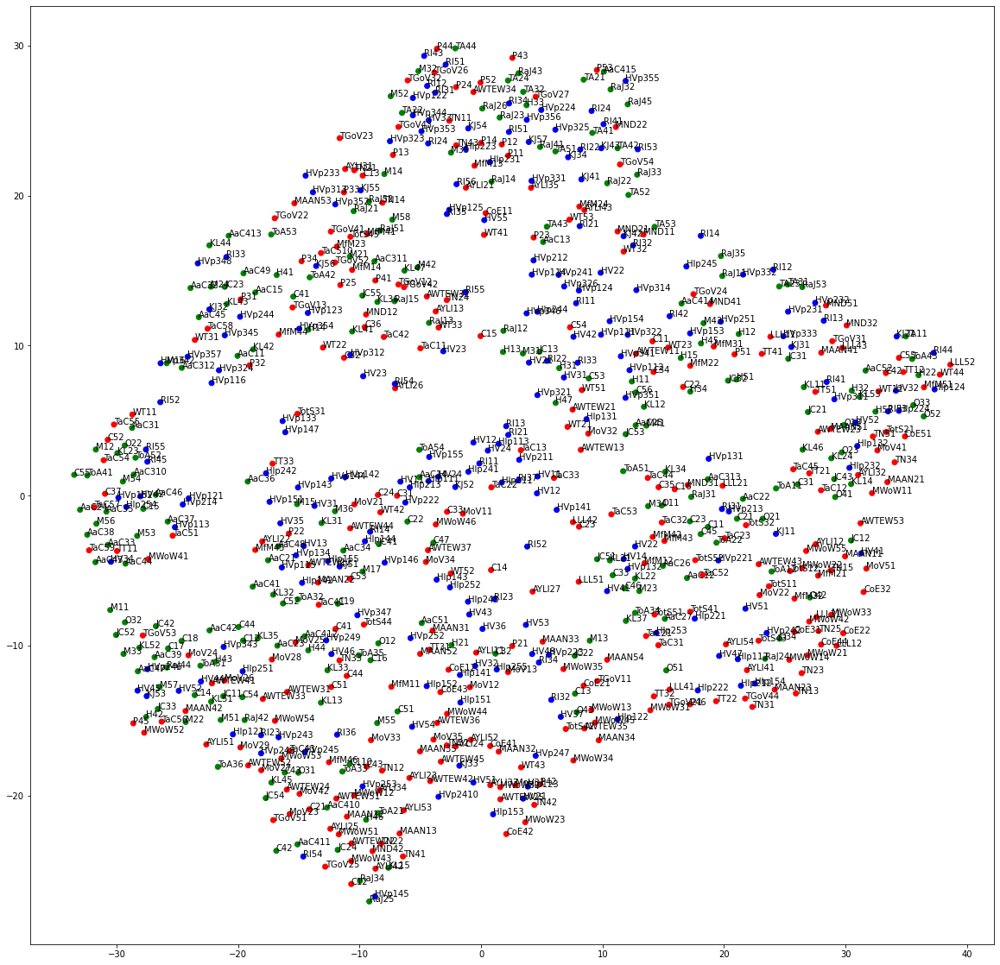

In [ ]:
x = []
y = []
for value in new_values:
    x.append(value[0])
    y.append(value[1])
colors = {'Comedy':'red', 'History':'blue', 'Tragedy':'green'}
#colors = {1:'red', 2:'blue', 3:'green', 4:'black', 5:"yellow"}
fig, ax = plt.subplots(figsize=(20,20))         
ax.scatter(x,y, c=scenes_df.Genre.apply(lambda x: colors[x]))
for i, names in enumerate([scenes_df6.Title.apply(lambda x: ''.join(i[0] for i in x.split())) + scenes_df6.ACT.astype(str) + scenes_df6.SCENE.astype(str)][0]):
    ax.annotate(names, (x[i], y[i]))
plt.show()

Plot ACTS By Title Using All Features

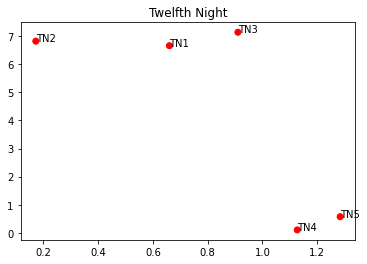

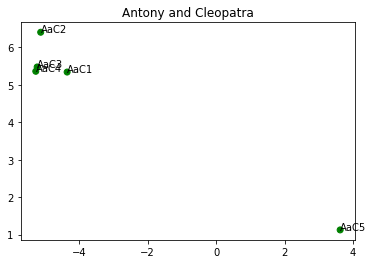

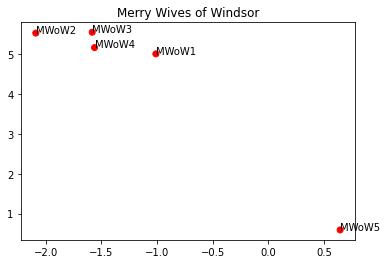

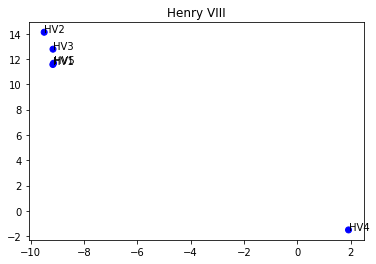

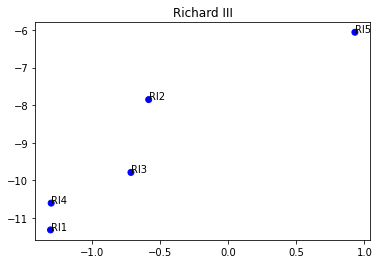

...

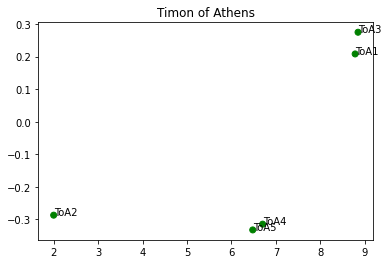

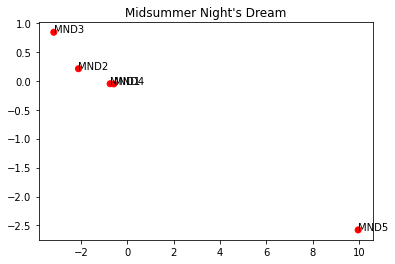

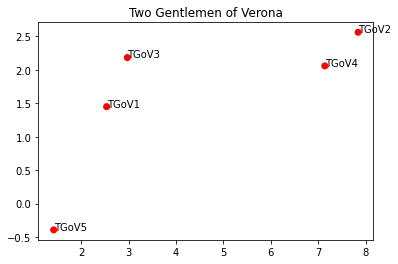

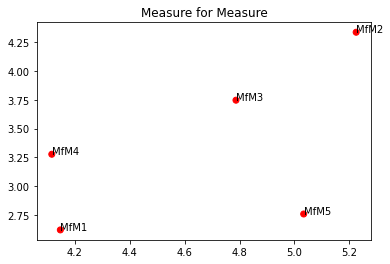

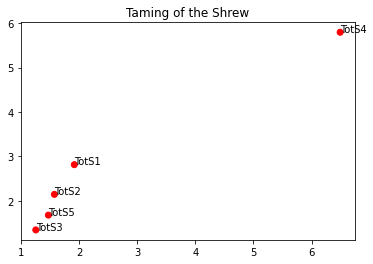

In [ ]:
scaler = StandardScaler()
scaler.fit(acts_df6.iloc[:,7:])
tsne_model = manifold.TSNE(perplexity=40, n_components=2, init='pca', method='exact', n_iter=2500, random_state=23) 
new_values = tsne_model.fit_transform(scaler.transform(acts_df6.iloc[:,7:]))
x = []
y = []
for value in new_values:
    x.append(value[0])
    y.append(value[1])
x = np.array(x)
y = np.array(y)

for title in set(acts_df6.Title):
  colors = {'Comedy':'red', 'History':'blue', 'Tragedy':'green'}
  #colors = {1:'red', 2:'blue', 3:'green', 4:'black', 5:"yellow"}
  fig, ax = plt.subplots(figsize=(6,4))         
  ax.scatter(x[acts_df6.Title == title], y[acts_df6.Title== title], c=acts_df[acts_df6.Title== title].Genre.apply(lambda x: colors[x]))
  for i, names in enumerate([acts_df6[acts_df6.Title== title].Title.apply(lambda x: ''.join(i[0] for i in x.split())) + acts_df6[acts_df6.Title== title].ACT.astype(str)][0]):
      ax.annotate(names, (x[acts_df6.Title== title][i], y[acts_df6.Title== title][i]))
      #ax.set_xlim([-12, 10])
      #ax.set_ylim([-12, 13])
  plt.title(title)
  plt.show()

Plot Scenes By Title Using All Features

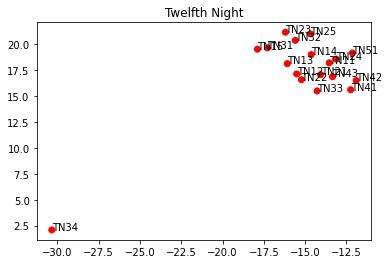

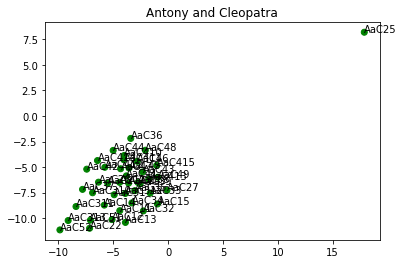

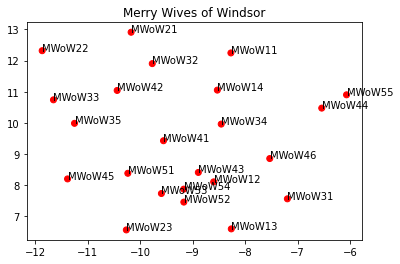

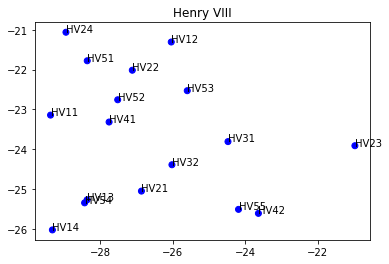

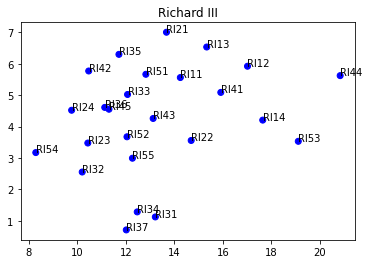

...

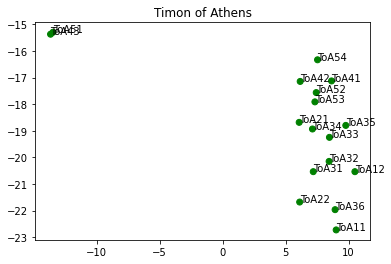

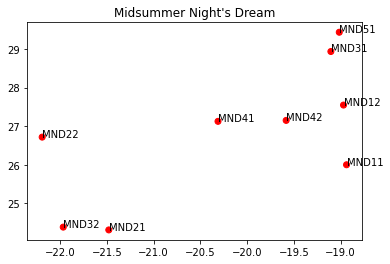

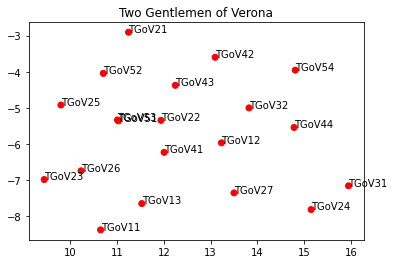

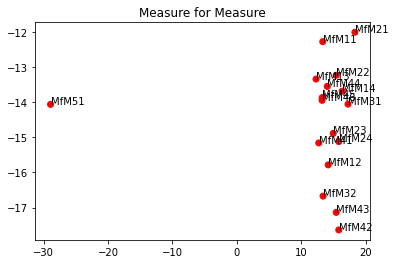

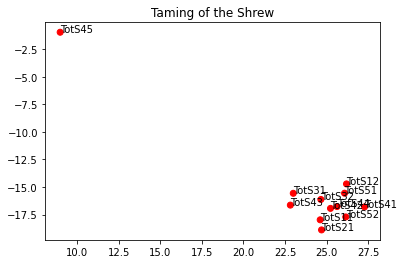

In [ ]:
scaler = StandardScaler()
scaler.fit(scenes_df6.iloc[:,8:])
tsne_model = manifold.TSNE(perplexity=40, n_components=2, init='pca', method='exact', n_iter=2500, random_state=23) 
new_values = tsne_model.fit_transform(scaler.transform(scenes_df6.iloc[:,8:]))
x = []
y = []
for value in new_values:
    x.append(value[0])
    y.append(value[1])
x = np.array(x)
y = np.array(y)

for title in set(scenes_df6.Title):
  colors = {'Comedy':'red', 'History':'blue', 'Tragedy':'green'}
  #colors = {1:'red', 2:'blue', 3:'green', 4:'black', 5:"yellow"}
  fig, ax = plt.subplots(figsize=(6,4))         
  ax.scatter(x[scenes_df6.Title == title], y[scenes_df6.Title== title], c=scenes_df[scenes_df6.Title== title].Genre.apply(lambda x: colors[x]))
  for i, names in enumerate([scenes_df6[scenes_df6.Title== title].Title.apply(lambda x: ''.join(i[0] for i in x.split())) + scenes_df6[scenes_df6.Title== title].ACT.astype(str) + scenes_df6[scenes_df6.Title== title].SCENE.astype(str)][0]):
      ax.annotate(names, (x[scenes_df6.Title== title][i], y[scenes_df6.Title== title][i]))
      #ax.set_xlim([-45, 45])
      #ax.set_ylim([-45, 45])
  plt.title(title)
  plt.show()

#Word Embedding

We will now use doc2vec to create vectors from Acts and Scenes.  The Vector space for each "unit" may give us some insight, or at least more features which could be helpful. 

First, defining a function to implement word embeddings. 

In [ ]:
#create word2vec
#i referenced o'reillys "Applied Text Analysis with Python" for the below

def doc2vec_func(df_in, v = 3):
  #print(df_in.shape)
  df = df_in 
  v_dim = v
  i = 0
  j = df.shape[0]
  corpus = df.key_words 

  tagged_corpus = [
      TaggedDocument(words, ['d{}'.format(idx)]) 
      for idx, words in enumerate(corpus)
    ]

  model = Doc2Vec(tagged_corpus, size=v_dim, min_count=0)

  vecs = []
  while i < j:
    vecs.append(model.docvecs[i])
    # print(vecs)
    # if i == 1:
    #   print(vecs)
    i = i + 1

  vecs = pd.DataFrame(vecs)
  df = pd.concat([df_in,vecs],axis = 1)
  return model,df

Here, we're going to scale the data and add some row indexing to help identify the segment (format is play name and act number for act dataframes, and both act and scene for scene dfs). 

I'm using just the numeric features, since it's debatable whether the categorical variables we used above would be valuable in such an analysis. 

In [320]:
acts = acts_df.iloc[:,11:]
scenes = scenes_df.iloc[:,17:]
# scenes.head(2)
scaler = StandardScaler()
scaler.fit(acts)
cols = acts.columns
acts_df3 = pd.DataFrame(scaler.transform(acts))
acts_df3.columns = cols
acts_df3 = pd.concat([acts_df.iloc[:,:8],acts_df3],axis=1)

scaler_scn = StandardScaler()
scaler_scn.fit(scenes)
cols_scn = scenes.columns
scenes_df3 = pd.DataFrame(scaler_scn.transform(scenes))
scenes_df3.columns = cols_scn
# scenes_df.iloc[:,:8].head(2)
scenes_df3 = pd.concat([scenes_df.iloc[:,:8],scenes_df3],axis=1)

In [ ]:
scenes_df3.shape

(746, 27)

In [ ]:
scenes_df3.head(2)

,Full_Document,Author,Genre,Title,ACT,SCENE,Proc_Document,key_words,polarity,num_words,num_unique_words,charachters,num_stopwords,num_punctuations,num_words_upper,mean_word_len,num_noun_phrases,sentence_length,topic_0,topic_1,topic_2,topic_3,topic_4,topic_5
0,I. Rousillon. The COUNT's palace.\n\nEnter BE...,Shakespeare,Comedy,All's Well That Ends Well,1,1,"[rousillon, palac, rousillon, black, deliv, bu...",rousillon palac rousillon black deliv buri hus...,0.105448,0.702302,0.818120,0.401988,0.724257,0.589808,0.229279,0.563426,0.417537,0.236132,0.519653,-0.520144,-0.316586,-0.606142,1.02453,-0.593465
1,II. Paris. The KING's palace.\n\nFlourish of ...,Shakespeare,Comedy,All's Well That Ends Well,1,2,"[palac, flourish, cornet, letter, diver, flore...",palac flourish cornet letter diver florentin s...,0.344417,-0.540725,-0.441711,-0.599894,-0.518839,-0.573896,-0.706118,0.472726,-0.475669,0.512615,-0.841448,-0.517067,3.472751,-0.603545,0.12717,-0.590875


Here I'm creating doc2vec in  vectorspace and 6.  Then I'm going to pull out the 6 dimensional vector into a new dataframe.

In [ ]:
act_modl, acts_df3 = doc2vec_func(acts_df3)
scn_modl, scenes_df3 = doc2vec_func(scenes_df3)

# scenes_df3.index = act_scn
scenes_df3.head(2)

,Full_Document,Author,Genre,Title,ACT,SCENE,Proc_Document,key_words,polarity,num_words,num_unique_words,charachters,num_stopwords,num_punctuations,num_words_upper,mean_word_len,num_noun_phrases,sentence_length,topic_0,topic_1,topic_2,topic_3,topic_4,topic_5,0,1,2
0,I. Rousillon. The COUNT's palace.\n\nEnter BE...,Shakespeare,Comedy,All's Well That Ends Well,1,1,"[rousillon, palac, rousillon, black, deliv, bu...",rousillon palac rousillon black deliv buri hus...,0.105448,0.702302,0.818120,0.401988,0.724257,0.589808,0.229279,0.563426,0.417537,0.236132,0.519653,-0.520144,-0.316586,-0.606142,1.02453,-0.593465,0.825535,0.481503,-0.687430
1,II. Paris. The KING's palace.\n\nFlourish of ...,Shakespeare,Comedy,All's Well That Ends Well,1,2,"[palac, flourish, cornet, letter, diver, flore...",palac flourish cornet letter diver florentin s...,0.344417,-0.540725,-0.441711,-0.599894,-0.518839,-0.573896,-0.706118,0.472726,-0.475669,0.512615,-0.841448,-0.517067,3.472751,-0.603545,0.12717,-0.590875,0.334356,0.407071,0.074795


In [ ]:
act_modl, acts_df4 = doc2vec_func(acts_df3.iloc[:,:-3], v = 6)
scn_modl, scenes_df4 = doc2vec_func(scenes_df3.iloc[:,:-3], v = 6)

act_vect = acts_df4.iloc[:,-6:]
act_vect.index = play_act

scene_vect = scenes_df4.iloc[:,-6:]
scene_vect.index = act_scn
scene_vect.head()

,0,1,2,3,4,5
All's Well That Ends Well11,0.730431,0.490309,-0.750871,-0.412395,0.335894,-0.251075
All's Well That Ends Well12,0.043044,0.383429,0.101104,-0.536010,-0.029734,-0.061047
All's Well That Ends Well13,0.446264,0.264406,-0.173926,-0.393638,0.179640,-0.034048
All's Well That Ends Well21,0.297144,0.050058,-0.036811,-0.891865,-0.100483,-0.320863
All's Well That Ends Well22,0.277512,0.335318,0.030407,-0.472476,0.041700,-0.041069


Below, we'll now visualize these 6 dimensional vectors using TSNE. 

In [ ]:
tsne_model = manifold.TSNE(perplexity=40, n_components=2, init='pca', method='exact', n_iter=2500, random_state=23) 
act_vect_tsne = tsne_model.fit_transform(act_vect)
scenes_vect_tsne = tsne_model.fit_transform(scene_vect)

185


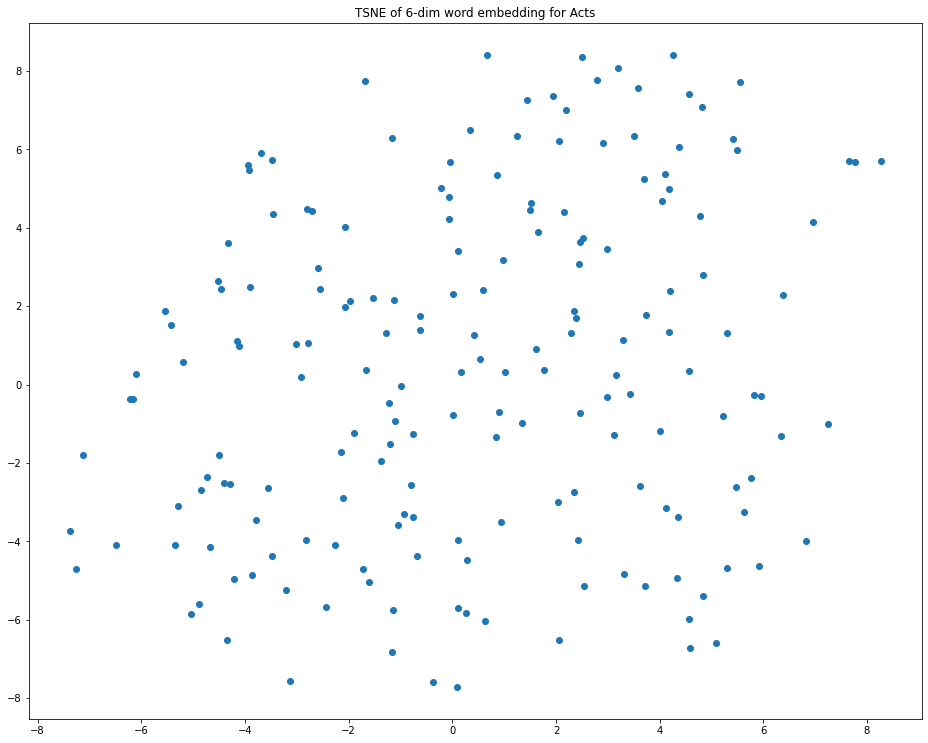

In [ ]:
x = []
y = []
for value in act_vect_tsne:
    x.append(value[0])
    y.append(value[1])
print(len(x))
# colors = {'Comedy':'red', 'History':'blue', 'Tragedy':'green'}
# colors = {1:'red', 2:'blue', 3:'green', 4:'black', 5:"yellow"}
plt.figure(figsize=(16, 12.8))         
plt.scatter(x,y) #c = act_vect_tsne.ACT.apply(lambda x: colors[x])
plt.title("TSNE of 6-dim word embedding for Acts")
plt.show()

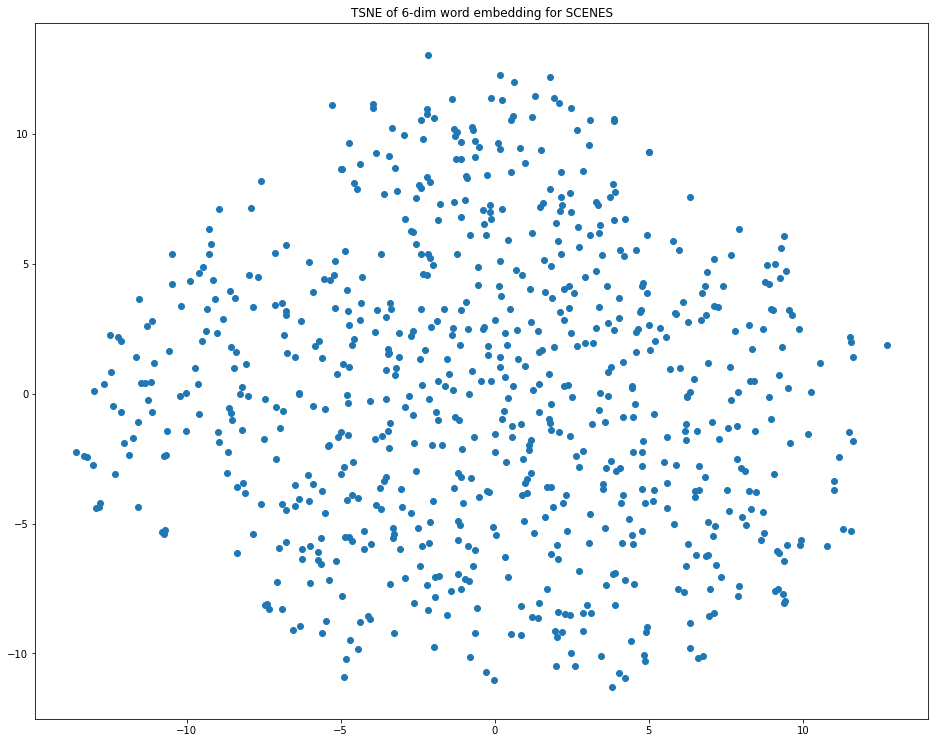

In [ ]:
x = []
y = []
for value in scenes_vect_tsne:
    x.append(value[0])
    y.append(value[1])
# print(len(x))
#colors = {'Comedy':'red', 'History':'blue', 'Tragedy':'green'}
# colors = {1:'red', 2:'blue', 3:'green', 4:'black', 5:"yellow"}
plt.figure(figsize=(16, 12.8))         
plt.scatter(x,y) #c = act_vect_tsne.ACT.apply(lambda x: colors[x])
plt.title("TSNE of 6-dim word embedding for SCENES")
plt.show()

Above, with the tsne of both the act vectors and the scene vectors I'm not seeing any kind of real clustering, and not much in terms of outliers. 

I'll try some other hyperparameters for the t-sne models. 

In [ ]:
tsne_model = manifold.TSNE(perplexity=90, n_components=2, init='pca', method='exact', n_iter=2500, random_state=23) 
act_vect_tsne = tsne_model.fit_transform(act_vect)
scenes_vect_tsne = tsne_model.fit_transform(scene_vect)

185


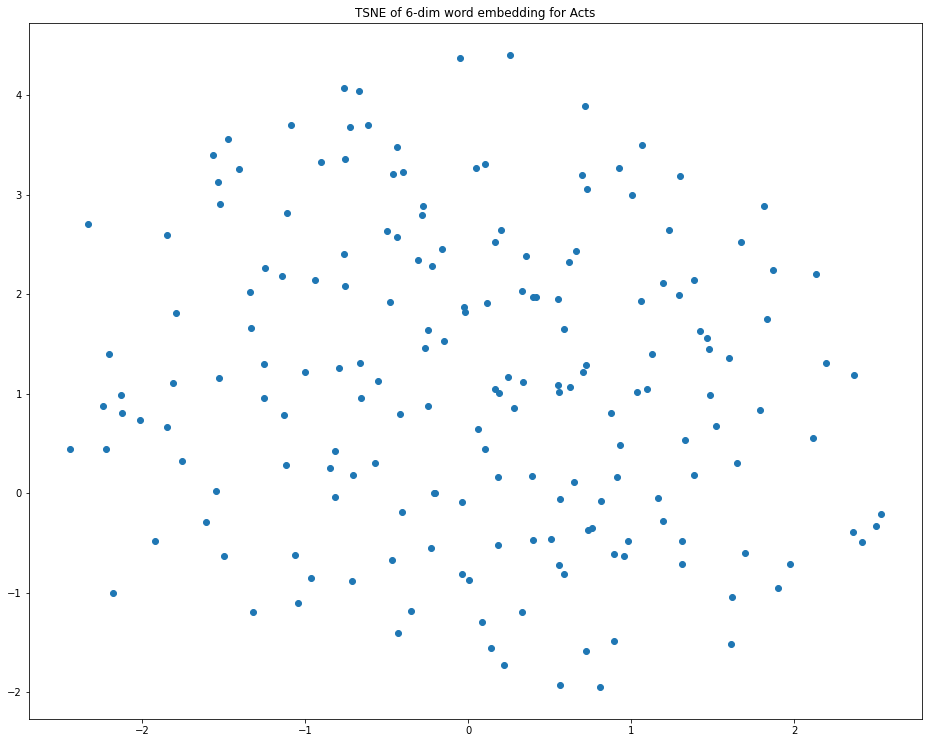

In [ ]:
x = []
y = []
for value in act_vect_tsne:
    x.append(value[0])
    y.append(value[1])
print(len(x))
# colors = {'Comedy':'red', 'History':'blue', 'Tragedy':'green'}
# colors = {1:'red', 2:'blue', 3:'green', 4:'black', 5:"yellow"}
plt.figure(figsize=(16, 12.8))         
plt.scatter(x,y) #c = act_vect_tsne.ACT.apply(lambda x: colors[x])
plt.title("TSNE of 6-dim word embedding for Acts")
plt.show()

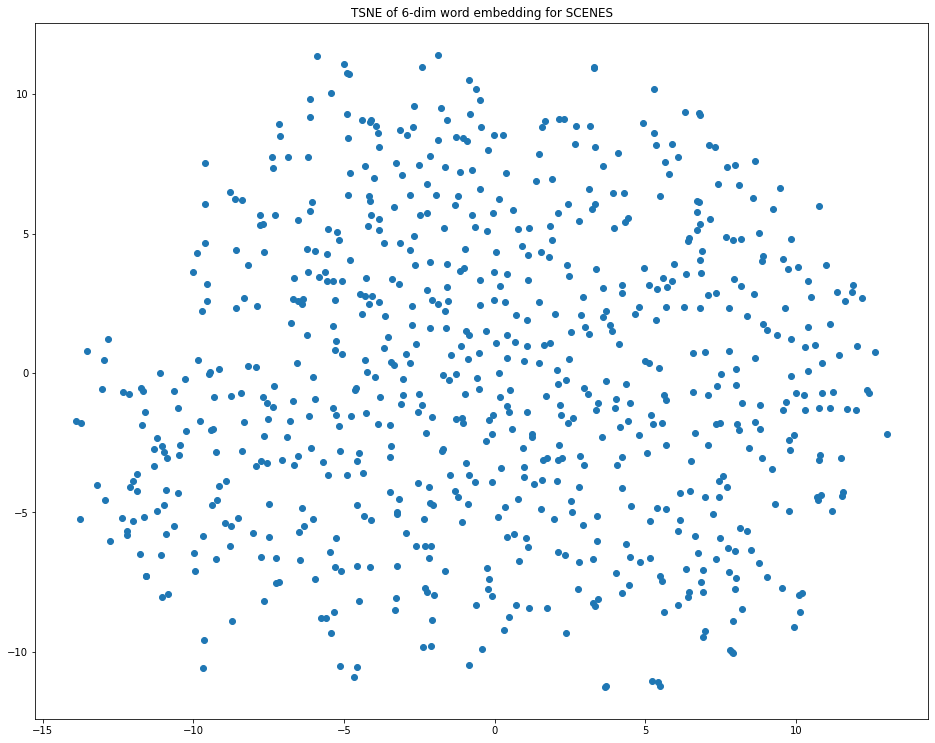

In [ ]:
x = []
y = []
for value in scenes_vect_tsne:
    x.append(value[0])
    y.append(value[1])
# print(len(x))
#colors = {'Comedy':'red', 'History':'blue', 'Tragedy':'green'}
# colors = {1:'red', 2:'blue', 3:'green', 4:'black', 5:"yellow"}
plt.figure(figsize=(16, 12.8))         
plt.scatter(x,y) #c = act_vect_tsne.ACT.apply(lambda x: colors[x])
plt.title("TSNE of 6-dim word embedding for SCENES")
plt.show()

Again, no interesting patterns.  I could overlay the above with colors - in other iterations of this we did just that, but to no avail. Similarly fruitless were attempts and using the 3-vector doc2vec. I will leave such analyses out from here because they don't add. 

What I will do is keep the 3-dimensional doc to vec with the hope that it will contribute some signal the the next analyses.  

# Clustering

Now we'll try a Kmeans clustering to see if we can see anything interesting.  After constructing the model we'll have first look at some pair wise plots to explore if we can see any interesting clustering effects.  

Note, for the below charts we run each scatterplot twice, once with labels and once without to get the most visual information out of them (the worded version is a little hard to see internal clustering, but good to identify outliers.  The one without labels is good to see if there is any interesting clustering. 

In [368]:
play_act = acts_df3.Title.map(str) + acts_df3.ACT.map(str)
act_scn = scenes_df3.Title.map(str) + scenes_df3.ACT.map(str) + scenes_df3.SCENE.map(str)

acts_numeric = acts_df4.iloc[:,8:]
scenes_numeric = scenes_df4.iloc[:,8:]

acts_numeric.index = play_act
scenes_numeric.index = act_scn

Below is mostly code for running the kmeans and plotting functions.

In [369]:
# capturing coliumn names
columns = acts_numeric.columns
col_scn = scenes_numeric.columns

# creating index based on play and act


In [372]:
random.seed(4)
kmeans = KMeans(n_clusters=4)
kmeans.fit(acts_numeric)
y_kmeans = kmeans.predict(acts_numeric)


def plot_kmean_labs(data,c1,c2,col_names):
  fig, ax = plt.subplots(figsize=(20,20))
  ax.scatter(data.loc[:, c1], data.loc[:, c2], c=y_kmeans, s=50, cmap='viridis')

  centers = pd.DataFrame(kmeans.cluster_centers_, columns = col_names)
  ax.scatter(centers.loc[:, c1], centers.loc[:, c2], c='red', s=150, alpha=0.5)

  ax.set_xlabel(c1, fontsize=30)
  ax.set_ylabel(c2, fontsize=30)
  ax.set_title(c1+" vs "+c2, fontsize=40)

  ax.grid(True)
  fig.tight_layout()

  for i,name in enumerate(data.index):
    idx = data.index[i]
    ax.annotate(name, (data.loc[idx, c1], data.loc[idx, c2]))

def plot_kmean(data,c1,c2,col_names):
  fig, ax = plt.subplots(figsize=(20,20))
  ax.scatter(data.loc[:, c1], data.loc[:, c2], c=y_kmeans, s=50, cmap='viridis')

  centers = pd.DataFrame(kmeans.cluster_centers_, columns = col_names)
  ax.scatter(centers.loc[:, c1], centers.loc[:, c2], c='red', s=150, alpha=0.5)

  ax.set_xlabel(c1, fontsize=30)
  ax.set_ylabel(c2, fontsize=30)
  ax.set_title(c1+" vs "+c2, fontsize=40)

  ax.grid(True)
  fig.tight_layout()


In [373]:
acts_numeric.shape

(185, 22)

Now that we have our KMeans model, I will explore some highlights of our pairwise analysis.  First you see noun phrases vs sentence length. 

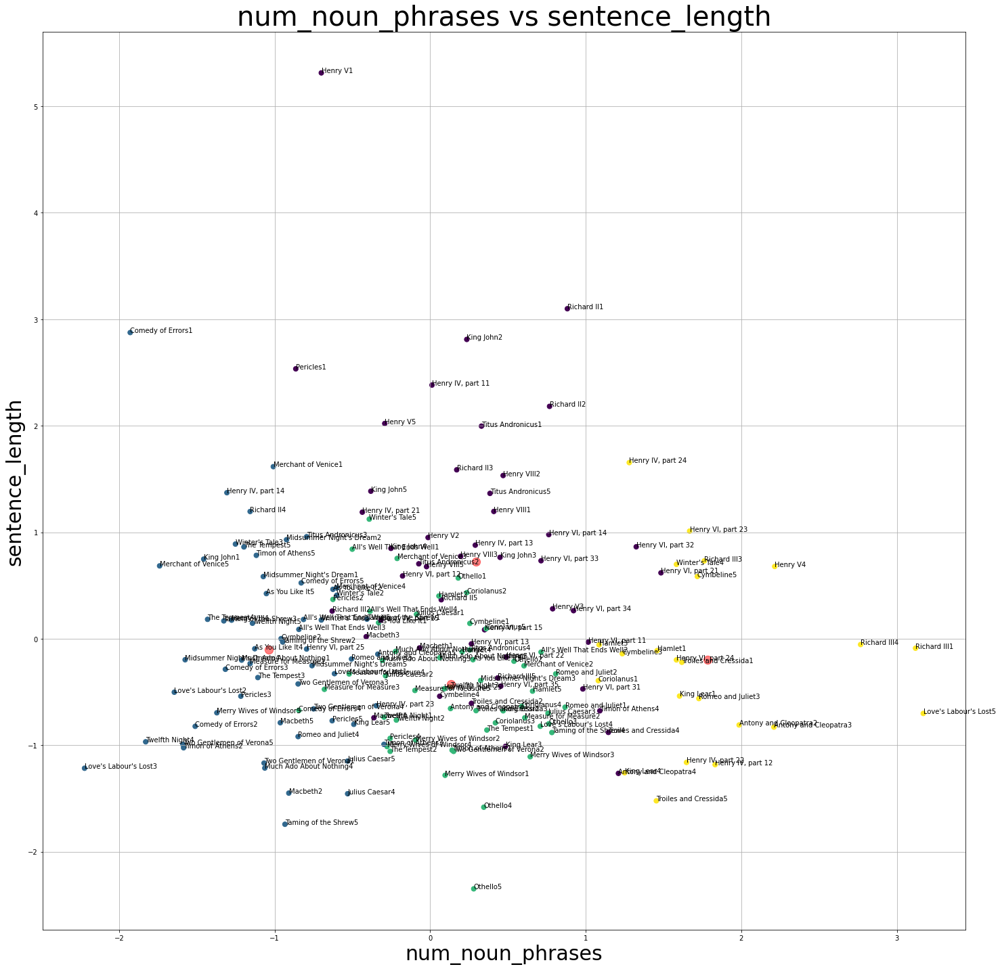

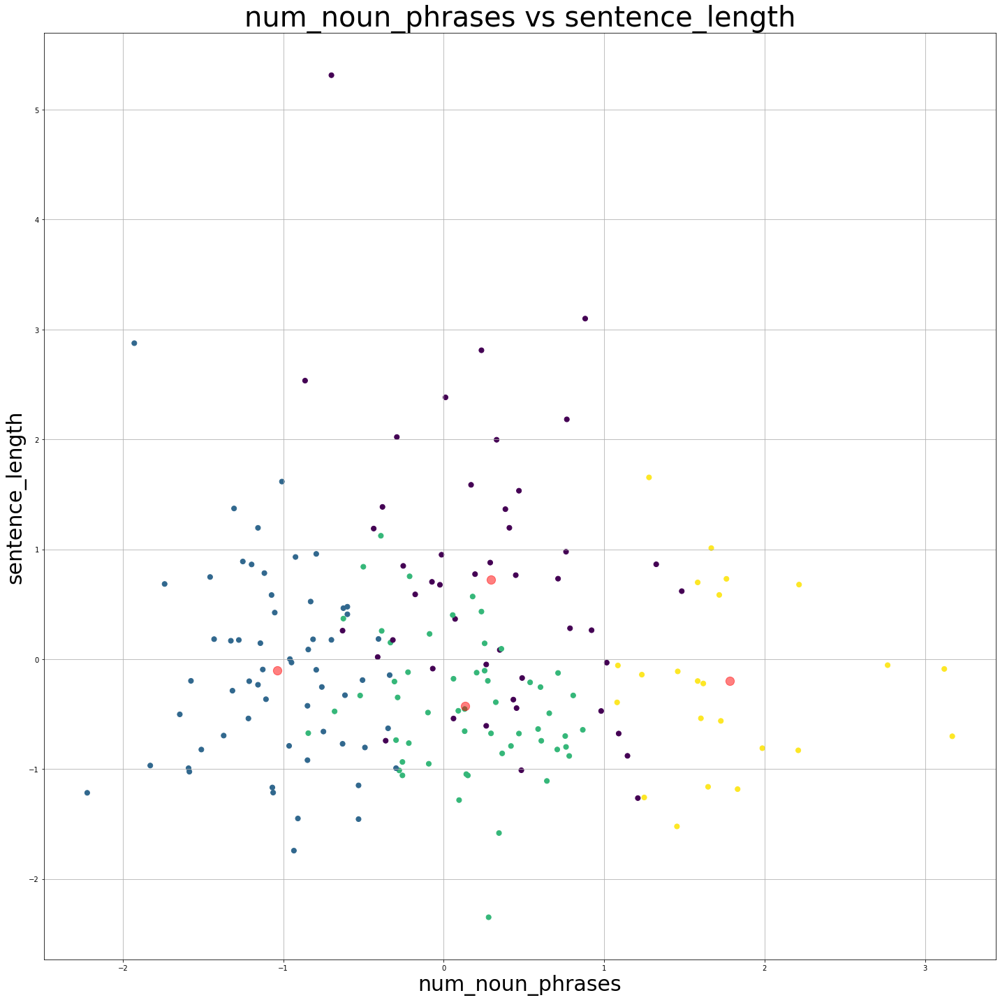

In [374]:
plot_kmean_labs(acts_numeric,'num_noun_phrases','sentence_length',columns)
plot_kmean(acts_numeric,'num_noun_phrases','sentence_length',columns)


Above, we don't see much in terms of interesting clustering - there just isn't enough separation. 


We do however see some outliers.  Specifically,

comedy or errors, richard II, richard III, Love’s Labour’s Lost


All seem to have a couple of acts that stand out visually as outliers. 

In [375]:
scenes_numeric.head()

,polarity,num_words,num_unique_words,charachters,num_stopwords,num_punctuations,num_words_upper,mean_word_len,num_noun_phrases,sentence_length,topic_0,topic_1,topic_2,topic_3,topic_4,topic_5,0,1,2,3,4,5
All's Well That Ends Well11,0.105448,0.702302,0.818120,0.401988,0.724257,0.589808,0.229279,0.563426,0.417537,0.236132,0.519653,-0.520144,-0.316586,-0.606142,1.024530,-0.593465,0.730431,0.490309,-0.750871,-0.412395,0.335894,-0.251075
All's Well That Ends Well12,0.344417,-0.540725,-0.441711,-0.599894,-0.518839,-0.573896,-0.706118,0.472726,-0.475669,0.512615,-0.841448,-0.517067,3.472751,-0.603545,0.127170,-0.590875,0.043044,0.383429,0.101104,-0.536010,-0.029734,-0.061047
All's Well That Ends Well13,0.470265,0.973244,1.009891,0.475897,1.129037,0.896957,0.487744,-0.880385,0.548438,1.052493,-0.449559,0.262528,0.395151,-0.606155,0.985025,-0.593480,0.446264,0.264406,-0.173926,-0.393638,0.179640,-0.034048
All's Well That Ends Well21,1.235847,0.641288,0.884707,0.287018,0.620297,0.490309,0.327742,-0.321065,0.617739,0.905955,0.091122,0.045565,1.729574,0.110225,-0.707561,-0.593469,0.297144,0.050058,-0.036811,-0.891865,-0.100483,-0.320863
All's Well That Ends Well22,-0.401811,-0.615182,-0.729368,-0.599894,-0.587409,-0.526309,-0.595348,-1.477150,-0.691271,-0.891069,-0.840438,-0.515692,-0.417551,-0.602386,2.335465,-0.589710,0.277512,0.335318,0.030407,-0.472476,0.041700,-0.041069


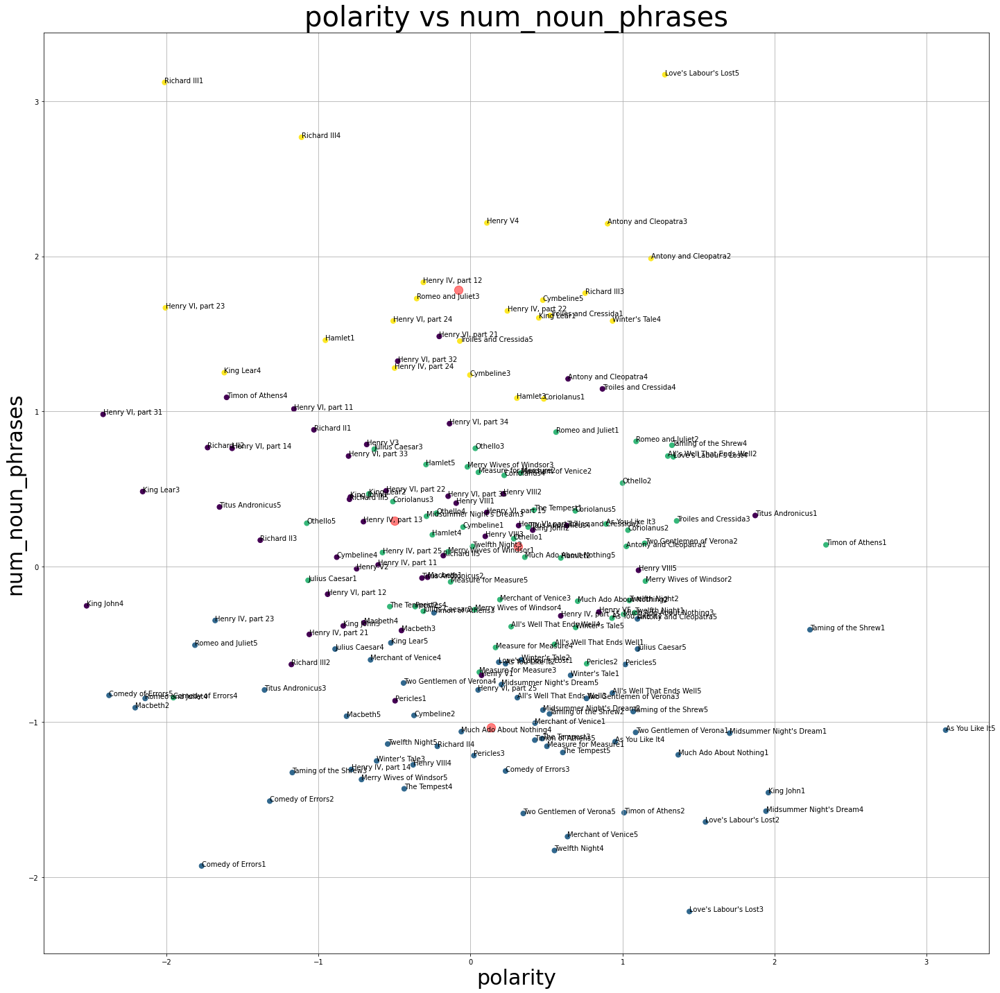

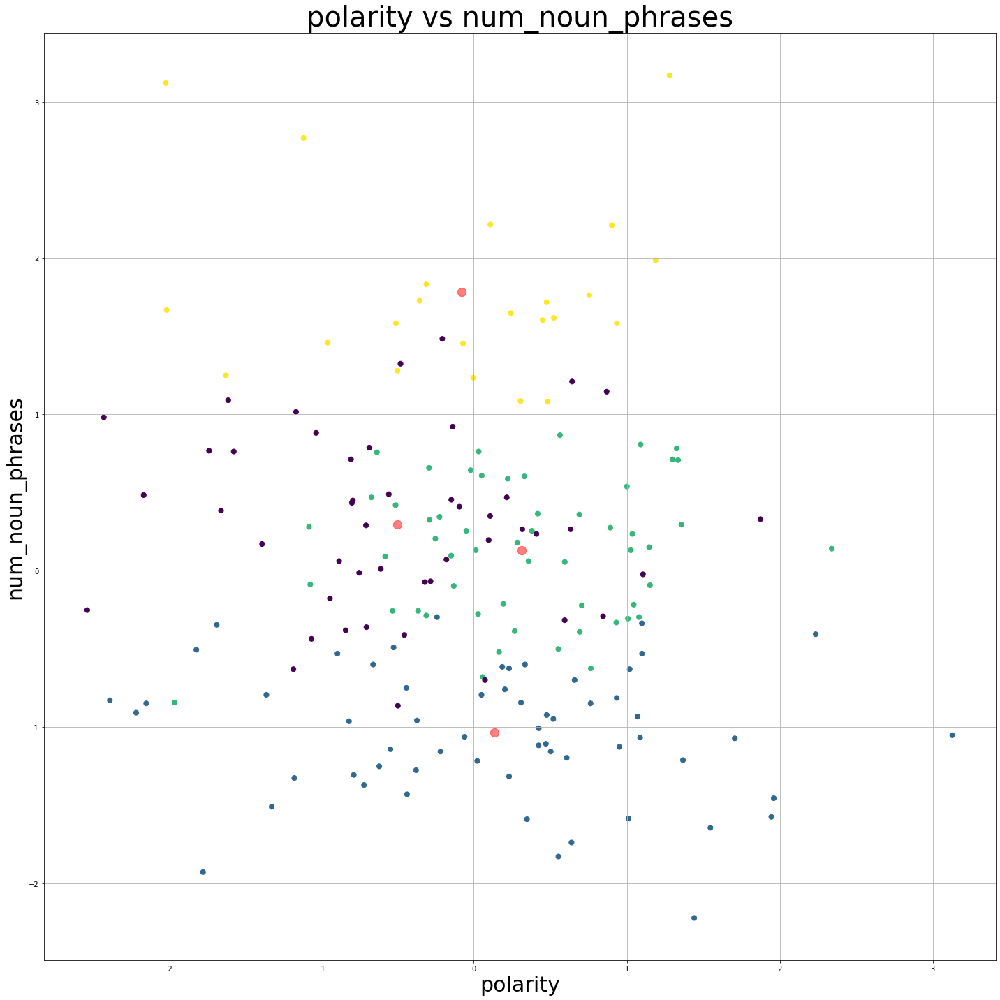

In [376]:
plot_kmean_labs(acts_numeric,'polarity', 'num_noun_phrases',col_scn)
plot_kmean(acts_numeric,'polarity', 'num_noun_phrases',columns)

Again, for polarity vs num of noun phrases

Richard III, Loves Labors, Lost, Comedy of Errors, seem to stand out on a visual basis at least. 

Just for exploration, lets do something similar for the scene data.  

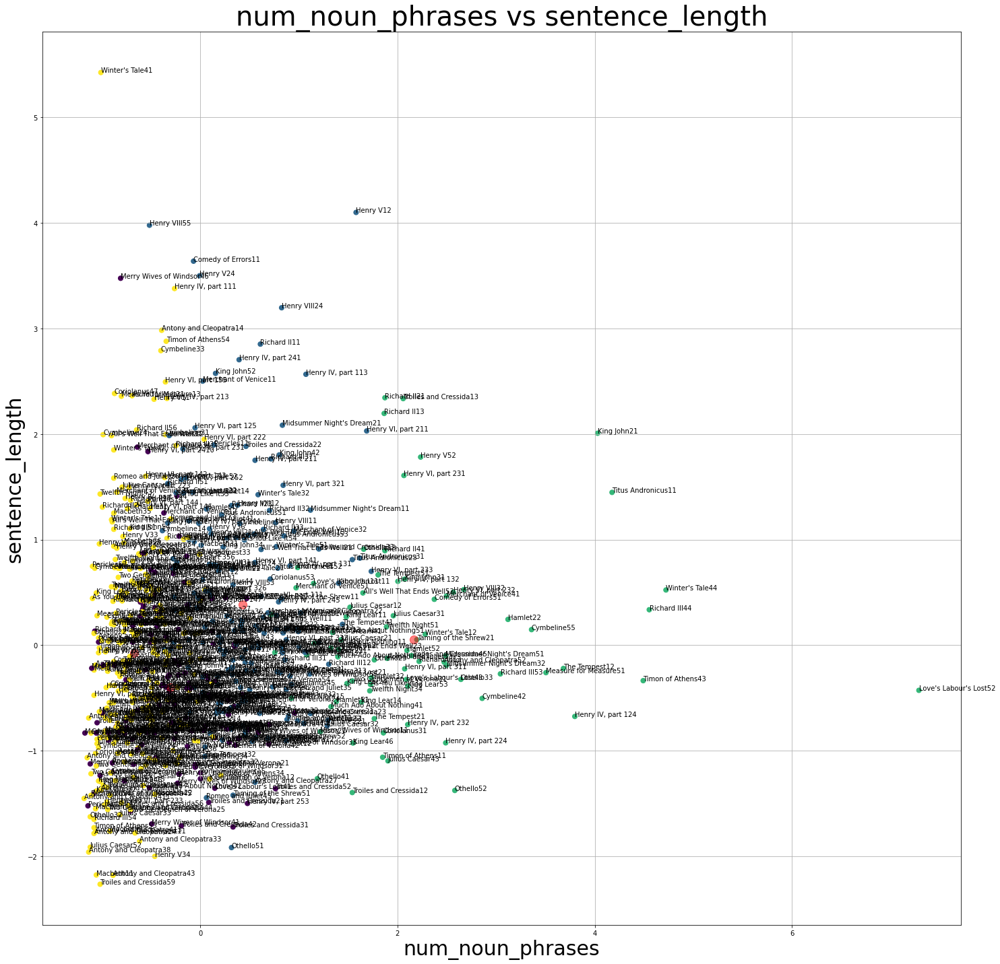

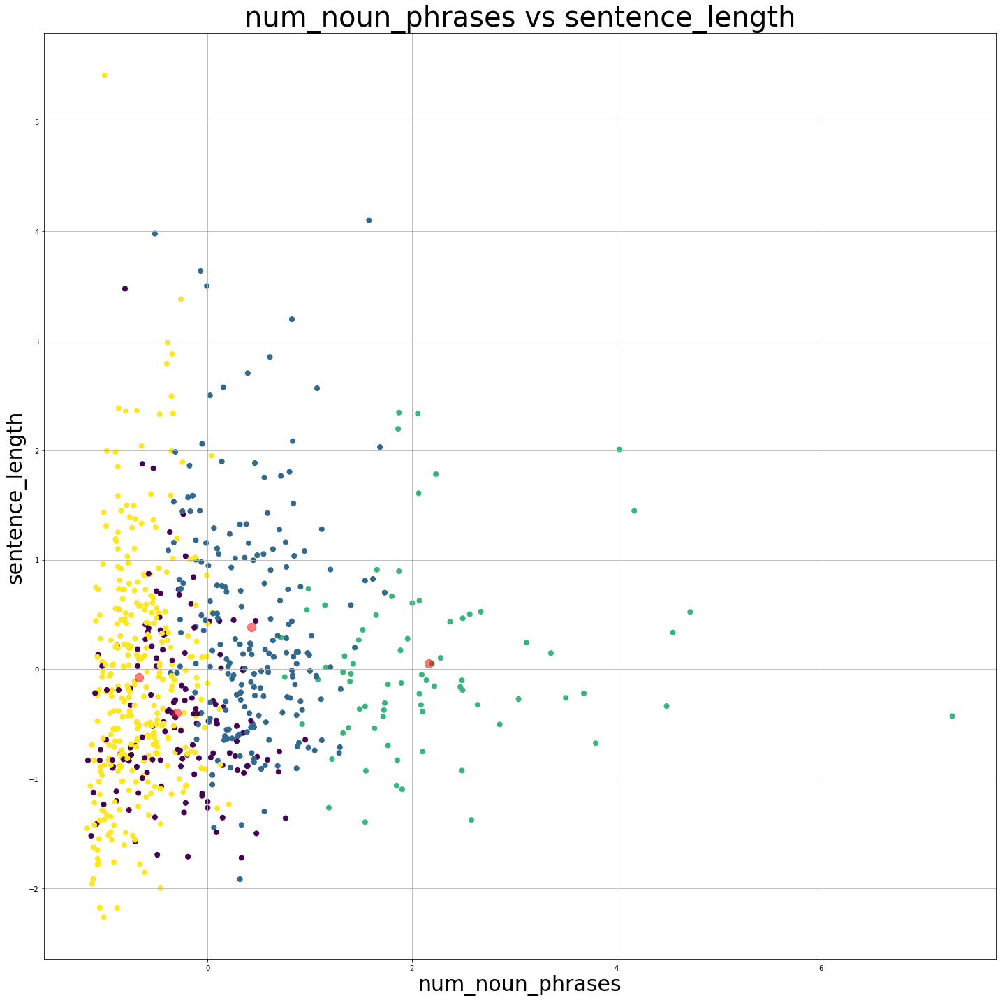

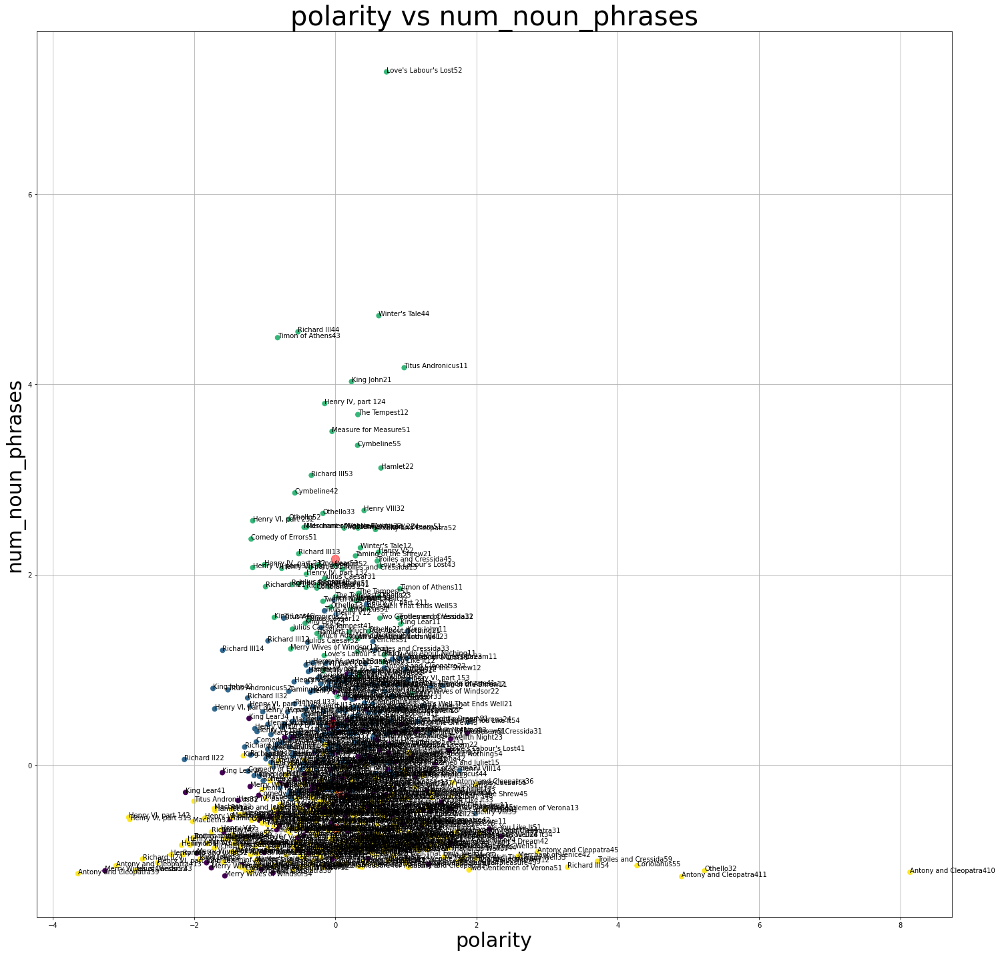

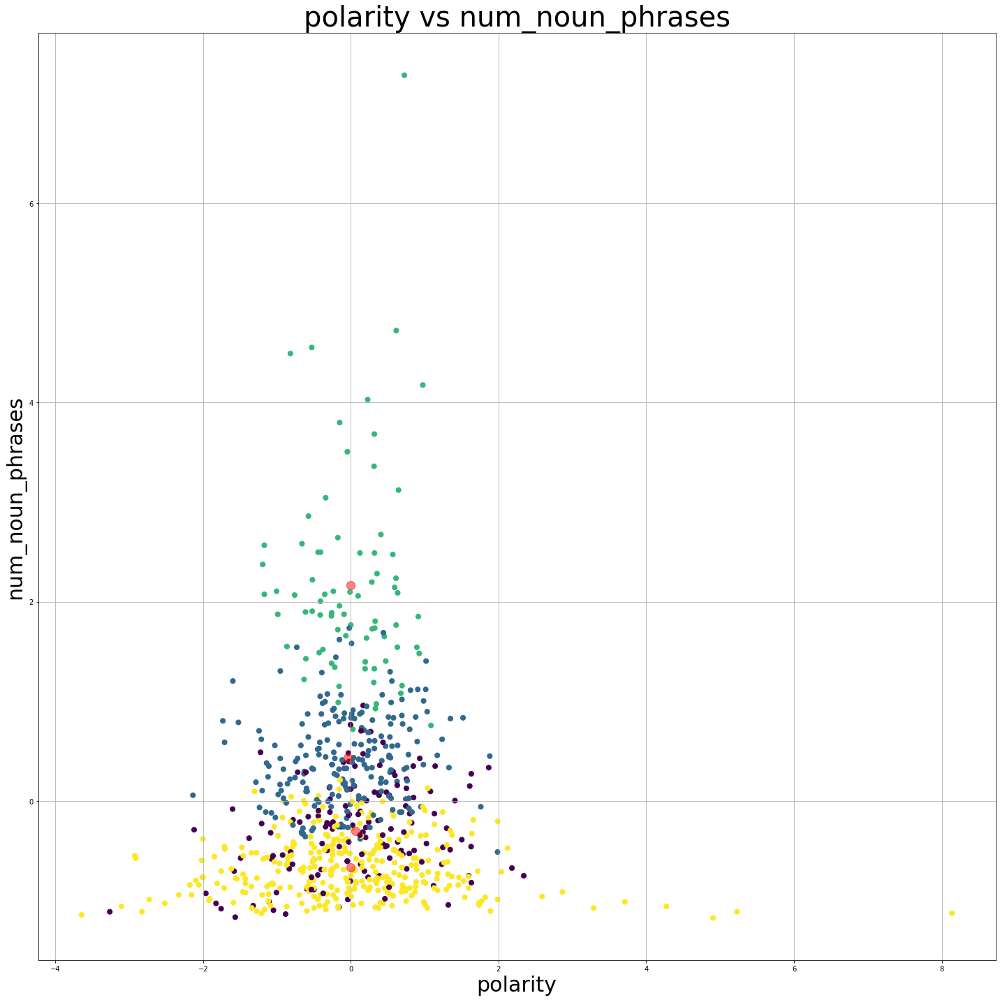

In [377]:
random.seed(4)
kmeans = KMeans(n_clusters=4)
kmeans.fit(scenes_numeric)
y_kmeans = kmeans.predict(scenes_numeric)
columns = scenes_numeric.columns


plot_kmean_labs(scenes_numeric,'num_noun_phrases','sentence_length',columns)
plot_kmean(scenes_numeric,'num_noun_phrases','sentence_length',columns)
plot_kmean_labs(scenes_numeric,'polarity', 'num_noun_phrases',columns)
plot_kmean(scenes_numeric,'polarity', 'num_noun_phrases',columns)

After running a k-means clustering and observing a few pairwise scatters on the "un-modified" data, we aren't seeing much clusterin,  these outliers are not totally consistent but there do seem to be some trends.

Since this type of analysis is very limited, we should take a look at a more robust method - we will do next is run PCA and visualize and thus try to analyze whether there our outliers while taking into account the higher dimensional space.

## PCA


First, let's try and determine how many components we should use on our scaled data. See below.

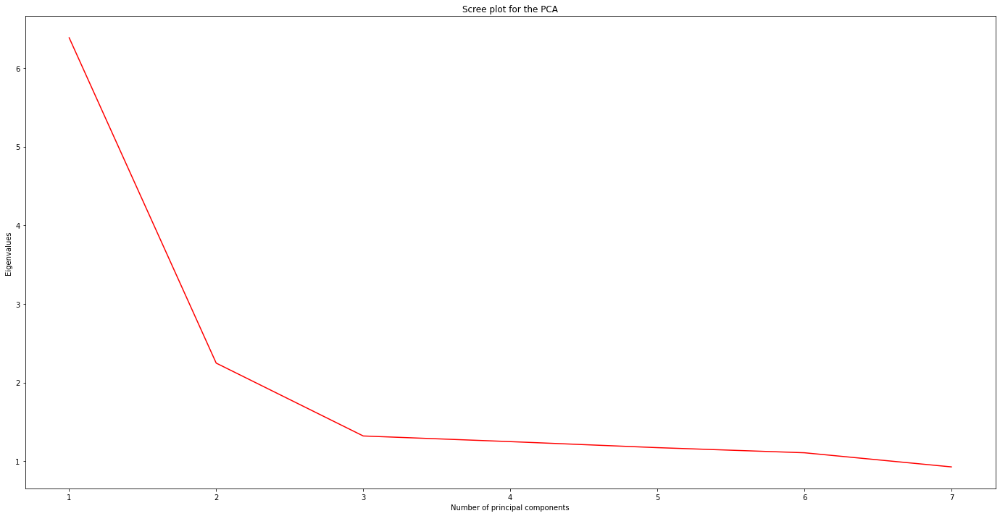

The 1st Principal Component explains 39.1 % of the variance

The 1st and 2nd Principal Components explain 52.9 % of the variance

The 1st, 2nd and 3rd Principal Components explain 61.0 % of the variance

The first four Principal Components explain 68.6 % of the variance



In [378]:
acts_pca = sklearn.decomposition.PCA(n_components=7).fit(acts_numeric)
acts_pca_coef = acts_pca.transform(acts_numeric) #acts_pca_coef = projected Data/ PC scores

# # we make a scree plot to see how many Principal Components to consider
plt.figure(figsize=(24, 12))
eig = acts_pca.explained_variance_
# and calculate the variance explained by the PC analysis
var_exp = acts_pca.explained_variance_ratio_.cumsum()*100.

plt.plot(np.arange(1,len(eig)+1), eig, color='r')
plt.title('Scree plot for the PCA')
plt.xlabel('Number of principal components')
plt.ylabel('Eigenvalues')
plt.show()

print ('The 1st Principal Component explains {:03.1f} % of the variance\n'.format(var_exp[0]))
print ('The 1st and 2nd Principal Components explain {:03.1f} % of the variance\n'.format(var_exp[1]))
print ('The 1st, 2nd and 3rd Principal Components explain {:03.1f} % of the variance\n'.format(var_exp[2]))
print ('The first four Principal Components explain {:03.1f} % of the variance\n'.format(var_exp[3]))

Based on the above I'll go ahead and stick with 2 principal components as this explains most of the variance - it's the "knee" in the curve.  one could argue 3 dimensions would work as well

In [379]:
acts_pca = sklearn.decomposition.PCA(n_components=2).fit(acts_numeric)
acts_pca_coef = acts_pca.transform(acts_numeric) #acts_pca_coef = projected Data/ PC scores

In [380]:
pca_col =  ['pc1','pc2']
acts_pca_coef = pd.DataFrame(acts_pca_coef)
acts_pca_coef.index = play_act
acts_pca_coef.columns = pca_col
acts_pca_coef.shape

(185, 2)

In [381]:
random.seed(4)
kmeans = KMeans(n_clusters=6)
kmeans.fit(acts_pca_coef)
y_kmeans = kmeans.predict(acts_pca_coef)


In [382]:
acts_pca_coef.head(2)
acts_pca_coef.shape

(185, 2)

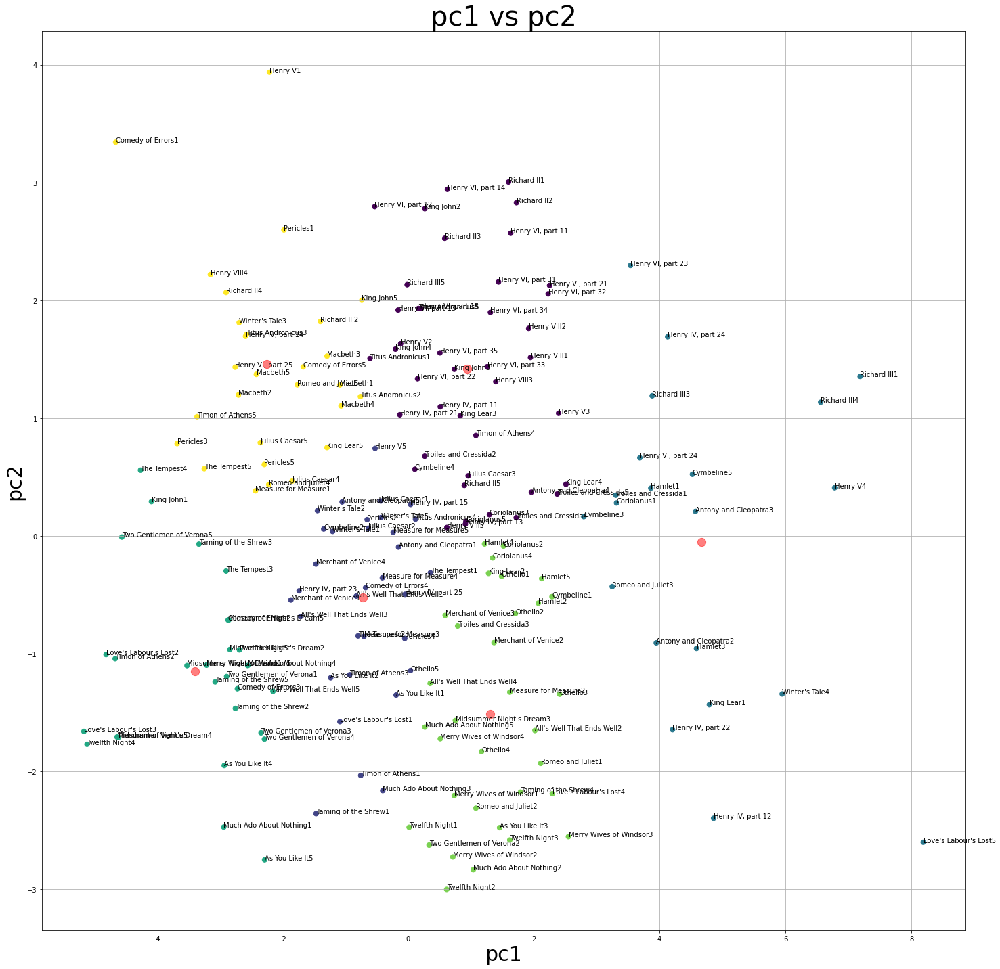

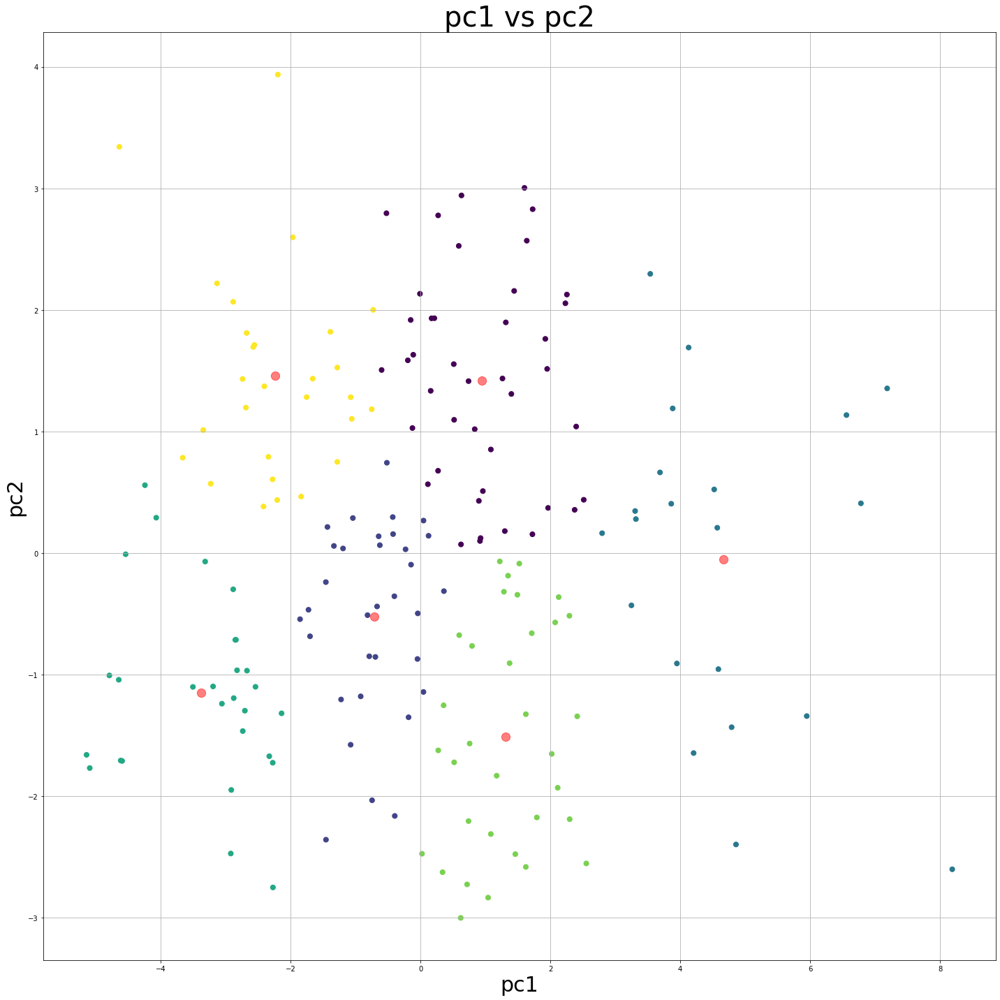

In [383]:
plot_kmean_labs(acts_pca_coef,'pc1','pc2',pca_col)
plot_kmean(acts_pca_coef,'pc1','pc2',pca_col)

We again are seeing something similar with the visual outliers.  

Henry V, Comedy of errors, Richard III, Loves Labours Lost all seem to have acts that fall outside the norm compared to Shakespeare other plays. 

Now I'll try something similar with the scenes

In [384]:
scenes_numeric.head(2)

,polarity,num_words,num_unique_words,charachters,num_stopwords,num_punctuations,num_words_upper,mean_word_len,num_noun_phrases,sentence_length,topic_0,topic_1,topic_2,topic_3,topic_4,topic_5,0,1,2,3,4,5
All's Well That Ends Well11,0.105448,0.702302,0.818120,0.401988,0.724257,0.589808,0.229279,0.563426,0.417537,0.236132,0.519653,-0.520144,-0.316586,-0.606142,1.02453,-0.593465,0.730431,0.490309,-0.750871,-0.412395,0.335894,-0.251075
All's Well That Ends Well12,0.344417,-0.540725,-0.441711,-0.599894,-0.518839,-0.573896,-0.706118,0.472726,-0.475669,0.512615,-0.841448,-0.517067,3.472751,-0.603545,0.12717,-0.590875,0.043044,0.383429,0.101104,-0.536010,-0.029734,-0.061047


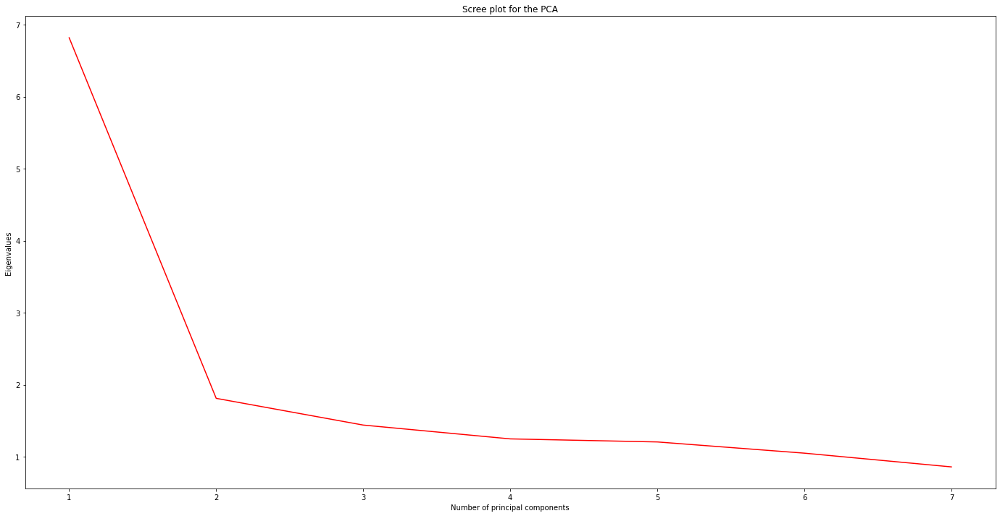

The 1st Principal Component explains 42.3 % of the variance

The 1st and 2nd Principal Components explain 53.5 % of the variance

The 1st, 2nd and 3rd Principal Components explain 62.4 % of the variance

The first four Principal Components explain 70.2 % of the variance



In [385]:
scenes_pca = sklearn.decomposition.PCA(n_components=7).fit(scenes_numeric)
scenes_pca_coef = scenes_pca.transform(scenes_numeric) #acts_pca_coef = projected Data/ PC scores

# # we make a scree plot to see how many Principal Components to consider
plt.figure(figsize=(24, 12))
eig = scenes_pca.explained_variance_
# and calculate the variance explained by the PC analysis
var_exp = scenes_pca.explained_variance_ratio_.cumsum()*100.

plt.plot(np.arange(1,len(eig)+1), eig, color='r')
plt.title('Scree plot for the PCA')
plt.xlabel('Number of principal components')
plt.ylabel('Eigenvalues')
plt.show()

print ('The 1st Principal Component explains {:03.1f} % of the variance\n'.format(var_exp[0]))
print ('The 1st and 2nd Principal Components explain {:03.1f} % of the variance\n'.format(var_exp[1]))
print ('The 1st, 2nd and 3rd Principal Components explain {:03.1f} % of the variance\n'.format(var_exp[2]))
print ('The first four Principal Components explain {:03.1f} % of the variance\n'.format(var_exp[3]))

This again looks like 2 Principal components is where it's at. 

In [395]:
# scenes_pca = sklearn.decomposition.PCA(n_components=2).fit(scenes_numeric)
# scenes_pca_coef = scenes_pca.transform(scenes_numeric) #acts_pca_coef = projected Data/ PC scores

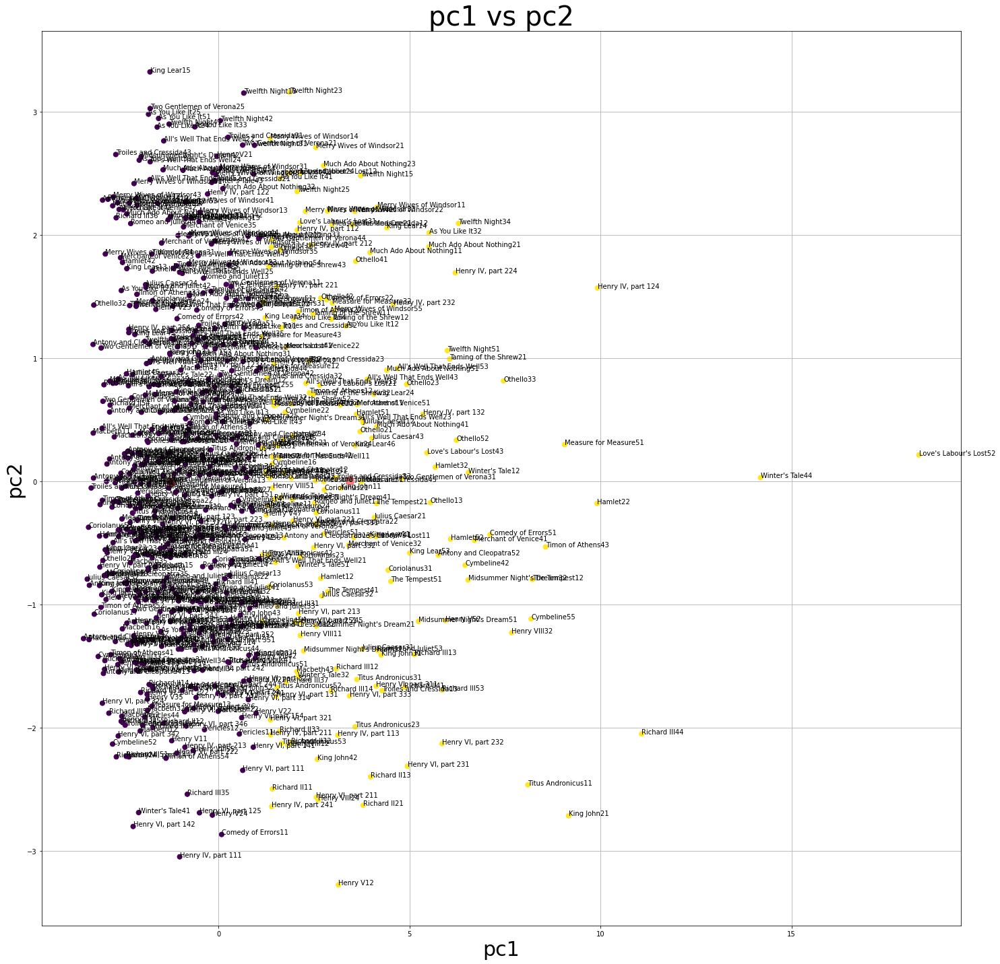

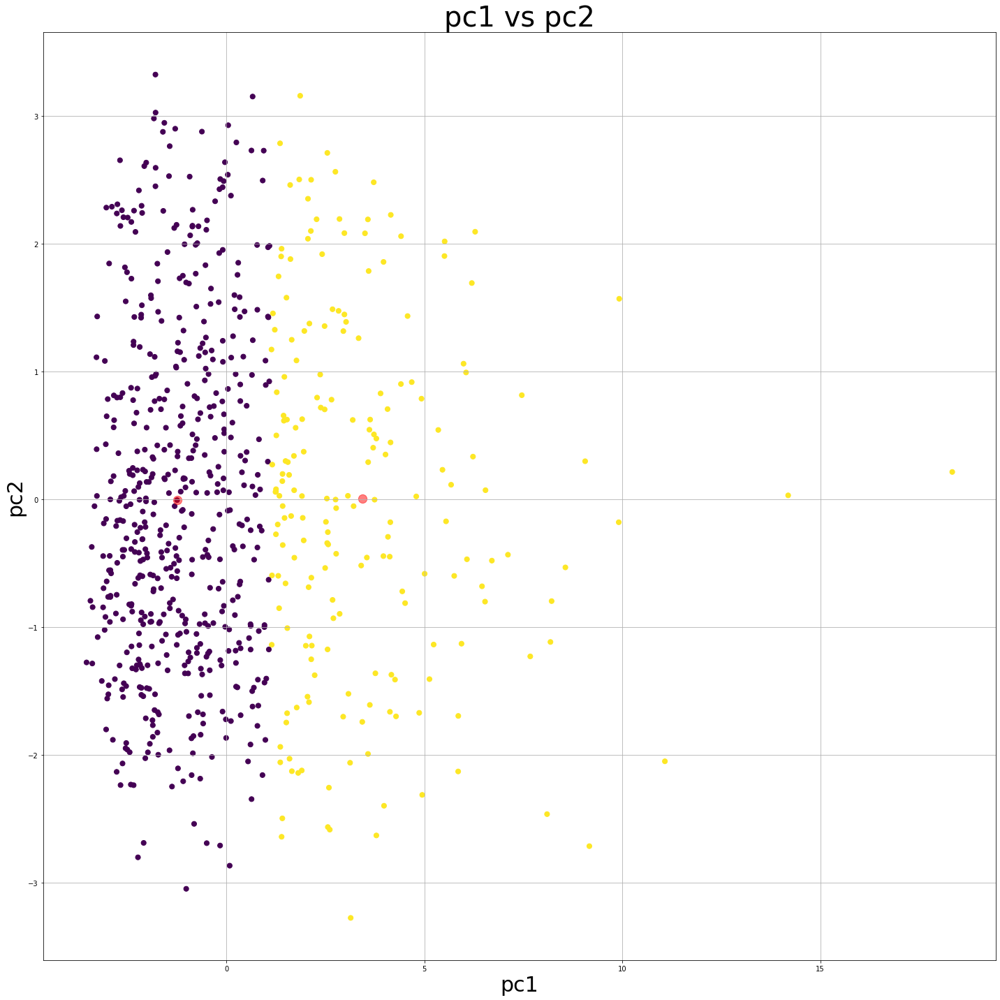

In [396]:


# random.seed(4)
# kmeans = KMeans(n_clusters=2)
# kmeans.fit(scenes_pca_coef)
# y_kmeans = kmeans.predict(scenes_pca_coef)

# scenes_pca_coef = pd.DataFrame(scenes_pca_coef)
# scenes_pca_coef.index = act_scn
# scenes_pca_coef.columns = pca_col

# plot_kmean_labs( scenes_pca_coef,'pc1','pc2',pca_col)
# plot_kmean(scenes_pca_coef,'pc1','pc2',pca_col)

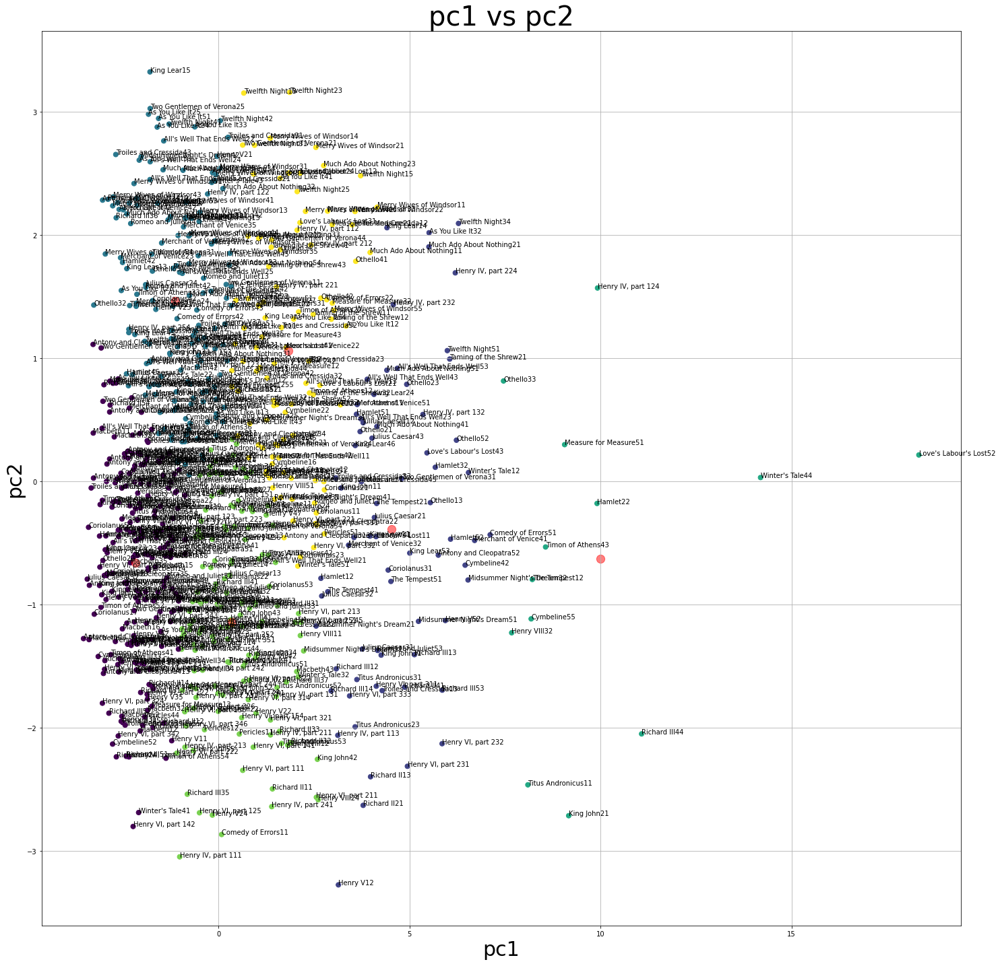

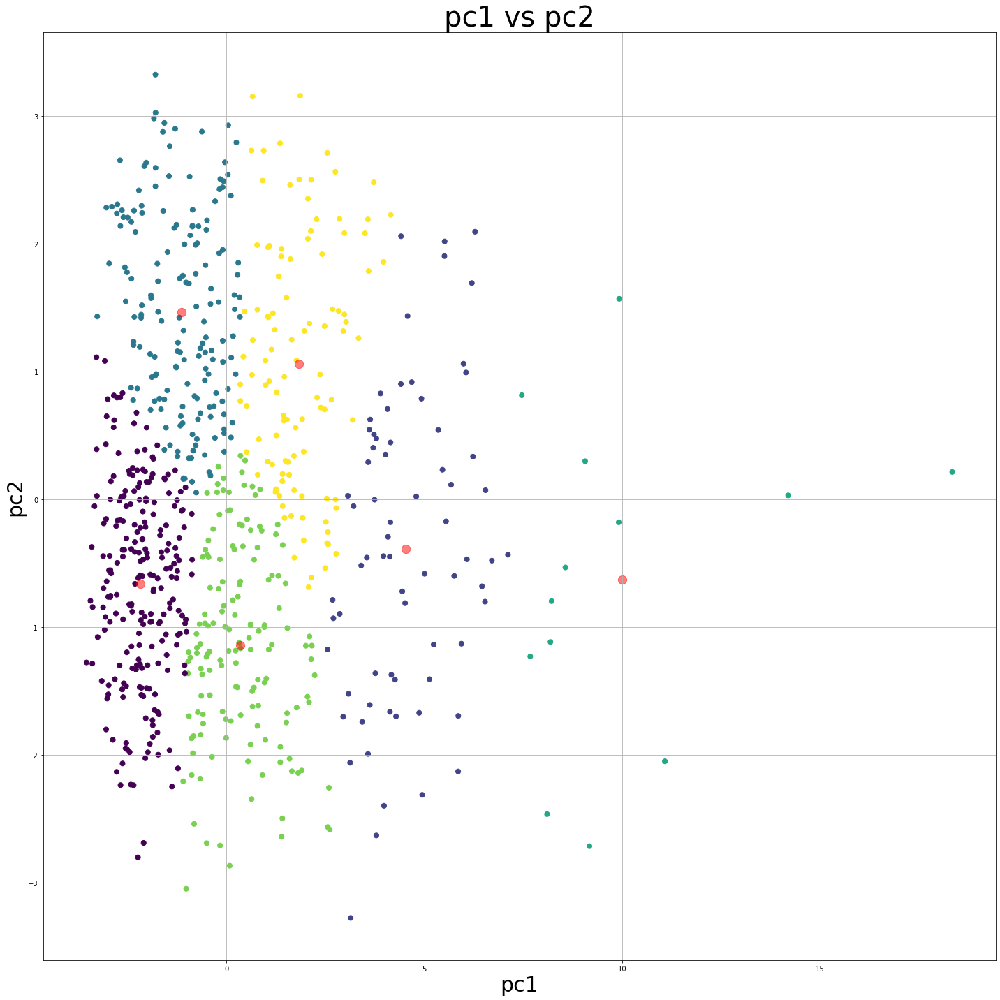

In [397]:
scenes_pca = sklearn.decomposition.PCA(n_components=2).fit(scenes_numeric)
scenes_pca_coef = scenes_pca.transform(scenes_numeric)

pca_col =  ['pc1','pc2']
scenes_pca_coef = pd.DataFrame(scenes_pca_coef)
scenes_pca_coef.index = act_scn
scenes_pca_coef.columns = pca_col
scenes_pca_coef.shape

random.seed(4)
kmeans = KMeans(n_clusters=6)
kmeans.fit(scenes_pca_coef)
y_kmeans = kmeans.predict(scenes_pca_coef)

# scenes_pca_coef.head(2)
# scenes_pca_coef.shape

plot_kmean_labs(scenes_pca_coef,'pc1','pc2',pca_col)
plot_kmean(scenes_pca_coef,'pc1','pc2',pca_col)

oves Labors Lost and Richard III  again stands out when it comes to specific scenes.  Compared to the previous act analyses however, we’re not seeing some of the usual suspects.   isn’t totally lost in the main cluster, but it’s not as prominent as it had been in some of our other views. 

Now also some new suspects pop up.  Specifically Henry V, Titus Andronicus, and King Lear. 

So far all of our anaysis has been pretty subjective and not super quantitative (mostly if not entirely visual). 

Let’s move on. 

# Outlier detection

Below, I'll use the LoF outlier detector to highlight specific outliers at a few different thresholds.  

In [ ]:
def plot_outliers(data, c1,c2,outliers):
  fig, ax = plt.subplots(figsize=(20,20))
  ax.scatter(data.loc[:, c1], data.loc[:, c2], c=np.array(outliers), s=50, cmap='viridis')

  ax.set_xlabel(c1, fontsize=30)
  ax.set_ylabel(c2, fontsize=30)
  ax.set_title(c1+" vs "+c2, fontsize=40)

  ax.grid(True)
  fig.tight_layout()

  for i,name in enumerate(data.index):
    idx = data.index[i]
    ax.annotate(name, (data.loc[idx, c1], data.loc[idx, c2]))


def calc_out(data, contam, row_idx):
  lof = LocalOutlierFactor(contamination = contam)
  out_pred = lof.fit_predict(data)
  out_pred_df = pd.DataFrame(out_pred,columns=['outlier'])
  out_pred_df.replace(1,0,inplace=True)
  out_pred_df.replace(-1,1,inplace=True)
  out_pred_df.index = row_idx
  out_pred_df = pd.concat([data,out_pred_df],axis=1)
  return out_pred_df

First at the act level at .05:

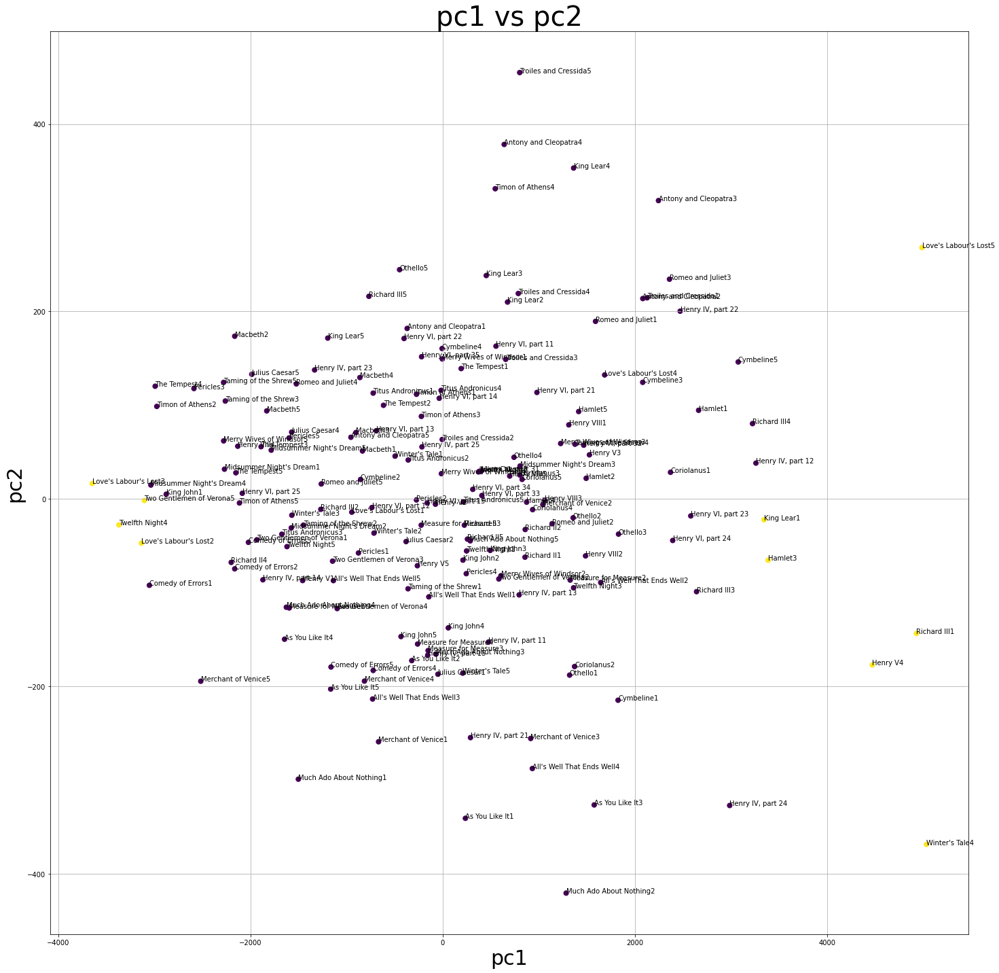

In [ ]:
acts_pca_outs = calc_out(acts_pca_coef, .05, play_act)
plot_outliers(acts_pca_outs, 'pc1','pc2',acts_pca_outs.outlier)

at the point .05 level we see some our suspicions confirmed.  Richard III act 1, Love’s labour’s lost 2, 3, and 5 are all quantified outliers.  

Finally some kind of of surprising ones - Hamlet 3 is marked as an outlier.  While it wasn’t exactly totally in the norm, we didn’t notice it in our earlier PCA and cluster analyses.  

Let's try at a lower threshold:

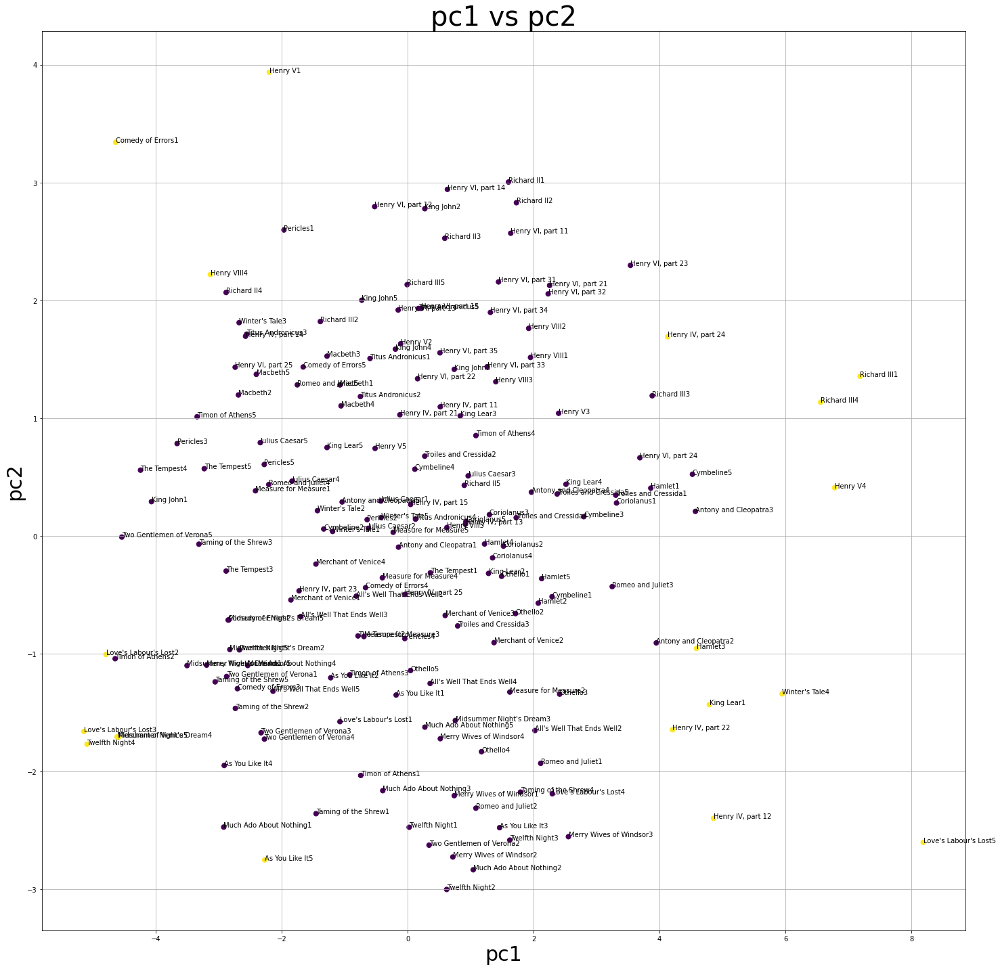

In [398]:
acts_pca_outs = calc_out(acts_pca_coef, .1, play_act)
plot_outliers(acts_pca_outs, 'pc1','pc2',acts_pca_outs.outlier)

Notable mentions at the .1% threshold include Hamlet3, Twelth Night4

Let's try now for scenes at the .05 threshold. 

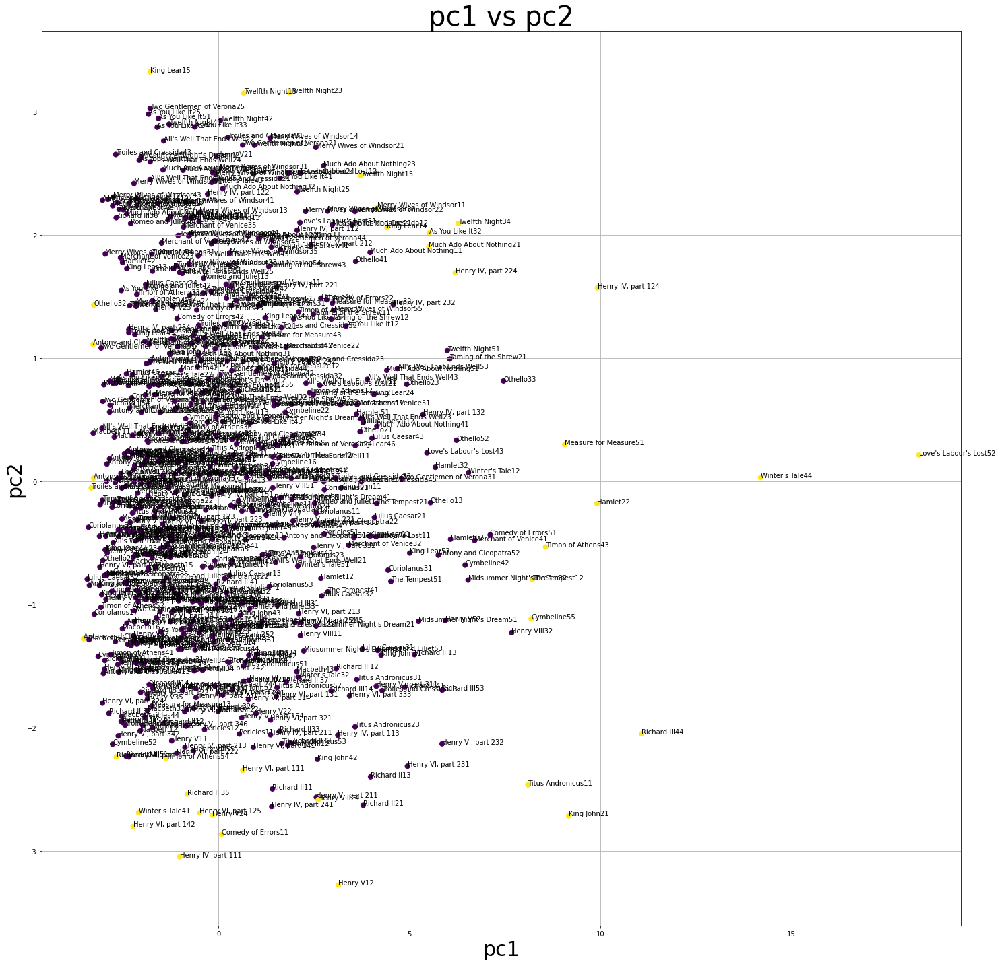

In [399]:
scenes_pca_outs = calc_out(scenes_pca_coef, .05, act_scn)
plot_outliers(scenes_pca_outs, 'pc1','pc2',scenes_pca_outs.outlier)

At this point we're seeing a pretty consistent outcome.  

# Summary

Our goal is was to identify whether or not Shakespeare's work was, to the extent possible via such an analysis, consistent with itself.  Since many have cast doubt on one man writing all of these works we wanted to at the very least identify the texts that are most likely to not be written by the same as the rest.  In the end this boils down to outlier detection.

We did this by pulling in a large quantity of external data, such as stop words, lists of characters, years that the plays were written, etc (see top section for the most detailed analysis.  

Much of this data didn't yeild a lot of resutls, so we ended up sticking with a core set of data, including a number of constructed features.  See below for our feature set (on the act level here, but we also had a scene dataset).

In [403]:
acts_df4.head(2)

,Full_Document,Author,Genre,Title,ACT,Proc_Document,key_words,Year,polarity,num_words,num_unique_words,charachters,num_stopwords,num_punctuations,num_words_upper,mean_word_len,num_noun_phrases,sentence_length,topic_0,topic_1,topic_2,topic_3,topic_4,topic_5,0,1,2,3,4,5
0,I\nSCENE I. Rousillon. The COUNT's palace.\n\...,Shakespeare,Comedy,All's Well That Ends Well,1,"[rousillon, palac, rousillon, black, deliv, bu...",rousillon palac rousillon black deliv buri hus...,1602,0.552503,-0.093978,0.012194,-0.601676,0.051147,-0.217864,-0.681441,0.002671,-0.501031,0.841010,-0.364115,0.817070,0.936861,-0.444719,-0.371916,-0.787769,0.225818,0.591076,-0.128917,-0.602410,0.020538,0.084492
1,II\nSCENE I. Paris. The KING's palace.\n\nFlo...,Shakespeare,Comedy,All's Well That Ends Well,2,"[palac, flourish, cornet, attend, diver, take,...",palac flourish cornet attend diver take leav f...,1602,1.298458,0.974594,0.835630,0.379868,1.103850,0.924265,0.919079,-0.906921,0.712694,-0.125594,-0.167429,1.311034,-0.305482,-0.445017,0.309140,-0.691711,0.586590,0.383492,-0.193863,-0.458953,0.124971,-0.430746


In addition to creating LDA topics, of which we included 5 in the final dataset, we also created a 6 dimensional doc2vec vector set.  We then reduced our dimensionality to 2 dimensions using PCA.  

We used a number of visual methods to try and subjectively identify outlying acts and scenes, and finally ended with the LoF outlier algorithm which gave us our most quantitative set of results.  

Based on this, Some of the more likely fraudulently SHakespeare acts and plays include:


*   Richard III
*   Love's Labour Lost

Amongst a few others that look likely. 

